In [1]:
# Libraries
import pandas as pd
import numpy as np
import random

import warnings
import statsmodels.api as sm

from collections import Counter
from collections import defaultdict
from statsmodels.formula.api import ols

from scipy import stats
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from scipy.stats import spearmanr

import plotly
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score

from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

from sklearn.pipeline import Pipeline
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
from imblearn.over_sampling import SMOTE

import lg_boost
import shap
import logistic_regression
import decision_tree
#import xgb_boost

    
warnings.filterwarnings('ignore')
np.random.seed(1)

/Users/kale/miniforge3/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Import datasets

In [2]:
df = pd.read_csv("06-20-19-thesis-dataset-without-outliers_allstates.csv")
#ne = pd.read_csv("nebraska-1992-2021-LTIP.csv")
ne = pd.read_csv("nebraska-all-years.csv")
ne_snowfall_freezethaw = pd.read_csv('nebraska-snowfall-freezethaw.csv')
baselines = pd.read_csv("baselines.csv")

In [3]:
ne.columns

Index(['_id', 'year', 'structureNumber', 'countyCode', 'yearBuilt',
       'yearReconstructured', 'averageDailyTraffic', 'avgDailyTruckTraffic',
       'deck', 'substructure', 'superstructure', 'owner',
       'maintainanceResponsibility', 'designLoad', 'deckWidthOutToOut',
       'operatingRating', 'structureLength', 'numberOfSpansInMainUnit',
       'scourCriticalBridges', 'yearReconstructed', 'structureType',
       'material', 'wearingSurface', 'membraneType', 'deckProtection',
       'coordinates', 'age', 'deckAge', 'longitude', 'latitude', 'adtCategory',
       'structureNumberSegment', 'deckBDSScore', 'substructureBDSScore',
       'superstructureBDSScore', 'deckDeteriorationScore'],
      dtype='object')

In [4]:
Counter(ne['deckProtection']) 

Counter({'0': 291001,
         'N': 80679,
         '1': 33359,
         '8': 6703,
         '3': 218,
         '9': 1122,
         '2': 4022,
         '4': 181,
         '7': 92,
         nan: 13786,
         '6': 55})

In [5]:
Counter(ne['membraneType'])

Counter({'0': 325338,
         'N': 80691,
         '8': 4510,
         '1': 4200,
         '3': 189,
         '2': 808,
         nan: 13786,
         '9': 1696})

## Data cleaning and Processing

### Snowfall and Freeze thaw

In [6]:
# Adding snowfall and freezethaw attributes
snowfall_map = defaultdict()
freeze_map = defaultdict()
 
# Creating structure number and attribute mapping (Snowfall and Freezethaw)
for bridge, snowfall, freezethaw in zip(ne_snowfall_freezethaw['Unnamed: 0'],
                                    ne_snowfall_freezethaw['snowfall'],
                                     ne_snowfall_freezethaw['freezethaw']):
    snowfall_map[bridge] = snowfall
    freeze_map[bridge] = freezethaw
    
# Adding New structure numbers without segment numbers
structure_numbers = list()
for structure_number in df['Structure Number']:
    structure_numbers.append(structure_number[:-2])
df['structureNumber'] = structure_numbers

# Creating mapping between Structure number and  Precipitation 
precipitation_map = defaultdict()
for bridge, precipitation in zip(df['structureNumber'], df['Avg. Daily Precipitation']):
    precipitation_map[bridge] = precipitation

In [7]:
# Creating structure number and attribute mapping (age, superstructure, deck, and substructure)
age_list = defaultdict(list)
superstructure_list = defaultdict(list)
deck_list = defaultdict(list)
substructure_list = defaultdict(list)

# Record in a map
for rec in ne.groupby('structureNumber'):
    bridge, r = rec
    temp_age_list = []
    temp_superstructure_list = []
    temp_deck_list = []
    temp_substructure_list = []
    
    for age, sup, dec, sub in zip(r['age'], r['superstructure'], r['deck'], r['substructure']):
        temp_age_list.append(age)
        temp_superstructure_list.append(sup)
        temp_deck_list.append(dec)
        temp_substructure_list.append(sub)
        
    age_list[bridge].append(temp_age_list)    
    superstructure_list[bridge].append(temp_superstructure_list)
    deck_list[bridge].append(temp_deck_list)
    substructure_list[bridge].append(temp_substructure_list)

In [8]:
# Add all columns
ne['snowfall'] = ne['structureNumber'].map(snowfall_map.get)
ne['freezethaw'] = ne['structureNumber'].map(freeze_map.get)
ne['precipitation'] = ne['structureNumber'].map(precipitation_map.get)

ne = ne.drop_duplicates(subset=['structureNumber'], keep='last')

print(f"Printing the shape of Nebraska Dataframe", ne.shape)
# Excluding culverts
ne = ne[~ne['structureType'].isin([19])]

# Age, Superstructure, Deck, and Substructure
ne['Age'] = ne['structureNumber'].map(age_list)
ne['Superstructure'] = ne['structureNumber'].map(superstructure_list)
ne['Substructure'] = ne['structureNumber'].map(substructure_list)
ne['Deck'] = ne['structureNumber'].map(deck_list)

Printing the shape of Nebraska Dataframe (17536, 39)


### Age, Superstructure, Deck, and Substructure

### Material and Owner

In [9]:
mapDictMaterial = {
                   1:'Concrete',
                   2:'ConcreteContinuous',
                   3:'Steel',
                   4:'SteelContinuous',
                   5:'PrestressedConcrete',
                   6:'PrestressedConcreteContinuous',
                   7:'Wood',
                   8:'Masonry',
                   9:'Aluminum',
                   0:'Other',
                 }


mapDictOwner = {
                1:'State Highway',
                2:'County Highway',
                3:'Town Highway',
                4:'City Highway',
                21:'Other State',
                25:'Other Local',
                27:'Railroad',
                62:'Bureau of Indian Affiars',
                69:'Bureau of Land Management',
                70:'Corps of Engineers'
               }


ne['materialCat'] = ne['material'].map(mapDictMaterial)
ne['ownerCat'] = ne['owner'].map(mapDictOwner)
ne['deckArea'] = ne['structureLength'] * ne['deckWidthOutToOut']

## Mapping improvement in the condition rating to intervention activity

In [10]:
from_to_matrix_kent = {
                   ('8', '9'): None,
                   ('7', '9'):'Repair',
                   ('6', '9'):'Repair',
                   ('5', '9'):'Rehab',
                   ('4', '9'):'Replace',
                   ('3', '9'):'Replace',
                   ('2', '9'):'Replace',
                   ('1', '9'): None, 

                   ('7', '8'): None,
                   ('6', '8'):'Repair',
                   ('5', '8'):'Repair',
                   ('4', '8'):'Replace',
                   ('3', '8'):'Replace',
                   ('2', '8'):'Replace',
                   ('1', '8'): None,

                   ('6', '7'): None,
                   ('5', '7'):'Repair',
                   ('4', '7'):'Rehab',
                   ('3', '7'):'Rehab',
                   ('2', '7'):'Rehab',
                   ('1', '7'): None,

                   ('5', '6'): None,
                   ('4', '6'):'Repair',
                   ('3', '6'):'Repair',
                   ('2', '6'):'Repair',
                   ('1', '6'): None,

                   ('4', '5'): None,
                   ('3', '5'):'Repair',
                   ('2', '5'):'Repair',
                   ('1', '5'): None,

                   ('3', '4'): None,
                   ('2', '4'):'Repair',
                   ('1', '4'): None,

                   ('2', '3'):'Repair',
                   ('1', '3'): None,

                   ('1', '2'): None

                  }

### Utility functions

In [11]:
def compute_intervention_utility(conditionRatings, interventionMap):
    """
    Description:
        A utility function for computing possible intervention
    by taking into consideration changes in condition rating. 
    The function implemented is based on Bridge Intervention Matrix by Tariq et al.

    Args:
        conditionRatings (list)
        interventionMap (dictionary)

    Returns:
        interventions (list)
        count (int)
    """
    i = 0
    interventions = list()
    interventions.append(None)
    for i in range(len(conditionRatings)-1):
        j = i + 1
        interv = interventionMap.get((conditionRatings[i], conditionRatings[j]))
        interventions.append(interv)
    count = len([count for count in interventions if count != None])
    return interventions, count

def convertStringToInt(listOfString):
    """
    Converts a list of string into a list of integer
    """
    listOfInteger = list()
    listSplit = list(listOfString)
    for string in listSplit:
        try:
            integer = int(string)
            listOfInteger.append(str(integer))
        except:
            pass
    return listOfInteger

def countInterventions(df):
    interventionCount = list()
    for conditionRatings in df['Deck']:
        conditionRatings = convertStringToInt(conditionRatings)
        interventions, number = compute_intervention_utility(conditionRatings,
                                                             from_to_matrix_kent)
        interventionCount.append(number)
    return interventionCount

# Attempt 2
def countInterventions(df):
    interventionCount = list()
    for conditionRatings in df['Deck']:
        conditionRatings = conditionRatings[0]
        conditionRatings = convertStringToInt(conditionRatings)
        interventions, number = compute_intervention_utility(conditionRatings,
                                                             from_to_matrix_kent)
        interventionCount.append(number)
    return interventionCount

def interventionCount(df, countDict, num):
    """
    Description:
        return a dictionary of intervention count
    
    Return:
        df: dataframe:
        num: number:
    """
    countDfInt = Counter(df['Intervention Count'])
    sumOfTheBridges = sum(countDfInt.values())
    for intervention in range(num):
        countDict[intervention].append((countDfInt[intervention]/sumOfTheBridges)*100)
        
    return countDict

def interventionCountNumber(df, countDict, num):
    """
    Description:
        return a dictionary of intervention count
    
    Return:
        df: dataframe:
        num: number:
    """
    countDfInt = Counter(df['Intervention Count'])
    sumOfTheBridges = sum(countDfInt.values())
    for intervention in range(num):
        countDict[intervention].append(countDfInt[intervention])     
    return countDict

In [12]:
def categorize_deterioration(df):
    """
    Categorize bridges by performance measured by Baseline Difference Score
    """
    median = df['deckDeteriorationScore'].median()
    mean = df['deckDeteriorationScore'].mean()
    q1 = df['deckDeteriorationScore'].quantile(0.25)
    q3 = df['deckDeteriorationScore'].quantile(0.75)

    det_category = list()
    for bds in df['deckDeteriorationScore']:
        if q1 > bds:
            det_category.append('Low')
#         elif:
#             det_category.append('High')
        elif q3 < bds:
            det_category.append('High')
        else:
            det_category.append('Mean')
    df['deterioration'] = det_category
    return df


# We convert the performance model into a binary classification model
def categorize_performance(df):
    """
    Categorize bridges by performance measured by Baseline Difference Score
    """
    median = df['deckBDSScore'].median()
    q1 = df['deckBDSScore'].quantile(0.10)
    q3 = df['deckBDSScore'].quantile(0.90)

    bds_category = list()
    for bds in df['deckBDSScore']:
        if median > bds:
            bds_category.append('Low')
        elif median < bds:
            bds_category.append('High')
        else:
            bds_category.append('Mean')
    df['performance'] = bds_category
    
    return df

def categorize_intervention(df):
    """
    categorize intervention
    """
    intervention_map = {0:'No',
                        1:'Yes',
                        2:'Yes',
                        3:'Yes',
                        4:'Yes'}

    df['maintenance_needed'] = df['Intervention Count'].map(intervention_map)
    return df

### Compute baseline

In [13]:
## Compute Baseline
def compute_baseline_utility(ages, ratings):
    """
    Description:
        Computes baseline, mean condition rating over age
    """
    
    age_rating = defaultdict(list)
    baseline_dict = defaultdict()
     
    for age, rating in zip(ages, ratings):
        age_rating[age].append(rating)
    
    # Compute mean of condition rating over value
    for key, value in age_rating.items():
        baseline_dict[key] = np.mean(value)
        
    return baseline_dict

def compute_baseline(df):
    ages_list = list()
    ratings_list = list()
    
    for index, row in df.iterrows():
        ages = row['Age'][0]
        ratings = row['Deck'][0]
        for age, rating in zip(ages, ratings):
            try:
                ages_list.append(int(age))
                ratings_list.append(int(rating))
            except:
                pass
            
    baseline_dict = compute_baseline_utility(ages_list, ratings_list)
    return baseline_dict

In [14]:
ne.columns

Index(['_id', 'year', 'structureNumber', 'countyCode', 'yearBuilt',
       'yearReconstructured', 'averageDailyTraffic', 'avgDailyTruckTraffic',
       'deck', 'substructure', 'superstructure', 'owner',
       'maintainanceResponsibility', 'designLoad', 'deckWidthOutToOut',
       'operatingRating', 'structureLength', 'numberOfSpansInMainUnit',
       'scourCriticalBridges', 'yearReconstructed', 'structureType',
       'material', 'wearingSurface', 'membraneType', 'deckProtection',
       'coordinates', 'age', 'deckAge', 'longitude', 'latitude', 'adtCategory',
       'structureNumberSegment', 'deckBDSScore', 'substructureBDSScore',
       'superstructureBDSScore', 'deckDeteriorationScore', 'snowfall',
       'freezethaw', 'precipitation', 'Age', 'Superstructure', 'Substructure',
       'Deck', 'materialCat', 'ownerCat', 'deckArea'],
      dtype='object')

## Create separate dataframes for wearing surfaces

In [15]:
# Using the wearing surface type, map all types of bridges
wearingSurfaceDict = {
            '1':'Monolithic Concrete',
            '2':'Integral Concrete',
            '3':'Latex Concrete',
            '4':'Low Slump Concrete',
            '5':'Epoxy Overlay',
            '6':'Bituminous',
            '7':'Wood or Timber',
            '8':'Gravel',
            '9':'Other',
            '0':'None',
            'N':'Not applicable'
        }

membraneDict = {
            '1':'Built-up',
            '2':'PerformedFabric',
            '3':'Epoxy',
            '8':'Unknown',
            '9':'Other',
            '0':'None',
            'N':'Not applicable'
        }

protectionDict = {
            '1':'Epoxy Coated Reinforcing',
            '2':'Galvanized Reinforcing',
            '3':'Other Protection',
            '4':'Cathodic Protection',
            '6':'Polymer Impregnated',
            '7':'Internally Sealed',
            '8':'Unknown',
            '9':'Not Applicable',
            '0':'None',
            'N':'Not applicable'
        }




ne['wearingSurfaceCategory'] = ne['wearingSurface'].map(wearingSurfaceDict)
ne['membraneCategory'] = ne['membraneType'].map(membraneDict)
ne['protectionCategory'] = ne['deckProtection' ].map(protectionDict)

concrete = ne[ne['wearingSurfaceCategory'] == 'Monolithic Concrete']
gravel = ne[ne['wearingSurfaceCategory'] == 'Gravel']
wood = ne[ne['wearingSurfaceCategory'] == 'Wood or Timber']
bit = ne[ne['wearingSurfaceCategory'] == 'Bituminous']
other = ne[ne['wearingSurfaceCategory'] == 'Other']
low = ne[ne['wearingSurfaceCategory'] == 'Low Slump Concrete']

concrete['Intervention Count'] = countInterventions(concrete)
gravel['Intervention Count'] = countInterventions(gravel)
wood['Intervention Count'] = countInterventions(wood)
bit['Intervention Count'] = countInterventions(bit)
other['Intervention Count'] = countInterventions(other)
low['Intervention Count'] = countInterventions(low)

#ages, ratings = compute_baseline(concrete)   
concrete_baseline_dict = compute_baseline(concrete)
gravel_baseline_dict = compute_baseline(gravel)
wood_baseline_dict = compute_baseline(wood)
bit_baseline_dict = compute_baseline(bit)
other_baseline_dict = compute_baseline(other)
low_baseline_dict = compute_baseline(low)

ages_val = list()
concrete_baseline_val = list()
gravel_baseline_val = list()
wood_baseline_val = list()
bit_baseline_val = list()
other_baseline_val = list()
low_baseline_val = list()

for i in range(5, 95):
    ages_val.append(i)
    concrete_baseline_val.append(concrete_baseline_dict[i])
    gravel_baseline_val.append(gravel_baseline_dict[i])
    wood_baseline_val.append(wood_baseline_dict[i])
    bit_baseline_val.append(bit_baseline_dict[i])
    other_baseline_val.append(other_baseline_dict[i])
    low_baseline_val.append(low_baseline_dict[i])

### One hot encoding of categorical values

In [16]:
# Preprocessing categorical values:
concrete = pd.get_dummies(concrete, columns=['materialCat','ownerCat', 'membraneCategory', 'protectionCategory'])
gravel = pd.get_dummies(gravel, columns=['materialCat','ownerCat', 'membraneCategory', 'protectionCategory'])
bit = pd.get_dummies(bit, columns=['materialCat','ownerCat', 'membraneCategory', 'protectionCategory'])
wood = pd.get_dummies(wood, columns=['materialCat','ownerCat', 'membraneCategory', 'protectionCategory'])
low = pd.get_dummies(low, columns=['materialCat','ownerCat', 'membraneCategory', 'protectionCategory'])
other = pd.get_dummies(other, columns=['materialCat','ownerCat', 'membraneCategory', 'protectionCategory'])

### Number of bridges in the study after removing culverts

In [17]:
ne.shape

(13481, 49)

### Removing outliers from structure length

In [18]:
segment_1_noisy = ne
# Removing outliers
segment_1 = segment_1_noisy[np.abs(stats.zscore(segment_1_noisy['structureLength']) < 3)]
print("Number of the bridges left after removing outliers")
print(segment_1.shape)
print("\n")

Number of the bridges left after removing outliers
(13313, 49)




### Create maintenance features

In [19]:
concrete = categorize_intervention(concrete)
gravel = categorize_intervention(gravel)
wood = categorize_intervention(wood)
low = categorize_intervention(low)
bit = categorize_intervention(bit)
other = categorize_intervention(other)

## Summary Dataset

In [20]:
def get_summary(df, col):
    # Calculate statistics
    df = df[df[col] > 0] 
    median = df[col].median()
    mean = df[col].mean()
    std = df[col].std()
    min_value = df[col].min()
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    max_value = df[col].max()
    
    print("\n")
    print("Attribute:", col)
    print("\n")
    
    # Print the statistics
    print("Mean:", mean)
    print("Median:", median)
    print("Standard Deviation:", std)
    print("Min:", min_value)
    print("Q1:", q1)
    print("Q3:", q3)
    print("Max:", max_value)

In [21]:
columns = ['averageDailyTraffic',
           'deckAge',
           'deckArea',
           'snowfall',
           'freezethaw',
           'precipitation',
           'deckDeteriorationScore',
           'deckBDSScore',
           'longitude',
           'latitude',
           'structureLength',
           'numberOfSpansInMainUnit'
          ]

# for i in columns:
#     get_summary(ne, i)

In [22]:
concrete.columns

Index(['_id', 'year', 'structureNumber', 'countyCode', 'yearBuilt',
       'yearReconstructured', 'averageDailyTraffic', 'avgDailyTruckTraffic',
       'deck', 'substructure', 'superstructure', 'owner',
       'maintainanceResponsibility', 'designLoad', 'deckWidthOutToOut',
       'operatingRating', 'structureLength', 'numberOfSpansInMainUnit',
       'scourCriticalBridges', 'yearReconstructed', 'structureType',
       'material', 'wearingSurface', 'membraneType', 'deckProtection',
       'coordinates', 'age', 'deckAge', 'longitude', 'latitude', 'adtCategory',
       'structureNumberSegment', 'deckBDSScore', 'substructureBDSScore',
       'superstructureBDSScore', 'deckDeteriorationScore', 'snowfall',
       'freezethaw', 'precipitation', 'Age', 'Superstructure', 'Substructure',
       'Deck', 'deckArea', 'wearingSurfaceCategory', 'Intervention Count',
       'materialCat_Concrete', 'materialCat_ConcreteContinuous',
       'materialCat_PrestressedConcrete',
       'materialCat_Prestres

In [23]:
def get_summary_categorical(df, col):
    # Calculate statistics
    freq_count = df[col].value_counts()
    percentage = df[col].value_counts(normalize=True)
    mode = df[col].mode()
    #pd.crosstab(df['column1_name'], df['column2_name'])
 
    print("\n")
    print("Attribute:", col)
    print("\n")
    
    # Print the statistics
    print("Frequency Count:", freq_count)
    print("\n")
    print("Percentage:", percentage)
    print("\n")
    print("Mode:", mode)

### Number of Bridges by Owners

In [24]:
# Selected Owners
segment_1 = ne
selectedOwners = segment_1[segment_1['owner'].isin([1, 2, 4])]

# Mapping agency names to agnecy code
selectedOwners['owner'] = selectedOwners['owner'].map({
                        1:'State Highway Agency',
                        2:'County Highway Agency',
                        4:'City or Muncipal Highway Agency'
                        })

# Counting number of bridges per owner
ownerCount = selectedOwners.groupby(['owner']).count()

# # Bar plot
fig = px.bar(ownerCount, x=ownerCount.index, y='structureNumber',
            labels=dict({'owner':"Owner",
                         'structureNumber':"Number of Bridges"}))
fig.show()

### Length of Bridges by Owners

In [25]:
state = selectedOwners[selectedOwners['owner'].isin(
    ['State Highway Agency'])]
city = selectedOwners[selectedOwners['owner'].isin(
    ['City or Muncipal Highway Agency'])]

county = selectedOwners[selectedOwners['owner'].isin(
    ['County Highway Agency'])]

print("The structure length of the bridge (City):",
      np.mean(city['structureLength']), "meters")

print("The structure length of the bridge (County):",
      np.mean(county['structureLength']), "meters")

print("The structure length of the bridge (State):",
      np.mean(state['structureLength']), "meters")

The structure length of the bridge (City): 58.066818181818185 meters
The structure length of the bridge (County): 19.29615916271722 meters
The structure length of the bridge (State): 69.47003352891869 meters


### Baselines (Mean condition ratings w.r.t age) of Deck, Superstructure, and Substructure

In [26]:
deckBDSMap = dict(zip(ne['structureNumber'], ne['deckBDSScore']))
substructureBDSMap = dict(zip(ne['structureNumber'], ne['substructureBDSScore']))
superstructureBDSMap = dict(zip(ne['structureNumber'], ne['superstructureBDSScore']))

#segment_1['Structure Number'] = segment_1['Structure Number'].str[:-2]
segment_1['deckBDSScore'] = segment_1['structureNumber'].map(deckBDSMap) 
segment_1['substructureBDSScore'] = segment_1['structureNumber'].map(substructureBDSMap)
segment_1['superstructureBDSScore'] = segment_1['structureNumber'].map(superstructureBDSMap) 


# Using the baseline data
ages = baselines['age'][1:65]
deck = baselines['deck'][1:65]
substructure = baselines['substructure'][1:65]
superstructure = baselines['superstructure'][1:65]

# Create traces
fig = go.Figure()
fig.add_trace(go.Scatter(x=ages, y=deck,
                    mode='lines+markers',
                    name='Deck',
                    line=dict(width=4)))

fig.add_trace(go.Scatter(x=ages, y=substructure,
                    mode='lines+markers',
                    name='Substructure',
                    line=dict(width=4)))

fig.add_trace(go.Scatter(x=ages, y=superstructure,
                    mode='lines+markers',
                    name='Superstructure',
                    line=dict(width=4, color="green")))

# Edit the layout
fig.update_layout(title='Baseline comparison of Deck, Substructure, and Superstructure',
                   xaxis_title='Years',
                   yaxis_title='Condition Rating (Mean)',
                   font=dict(size=18),
                   yaxis = dict(
                       tickmode = 'array',
                       tickvals = [1, 2, 3, 4, 5, 6, 7, 8, 9],
                       tickfont=dict(size=16),
                   ),
                   xaxis = dict(
                       tickmode = 'array',
                       #tickvals = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120],
                       tickvals = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120],
                       tickfont=dict(size=16)
                       ),
                  plot_bgcolor='white') 
fig.show()

In [27]:
## Making case for understanding the bridge deck get repaired more, and deteriorates faster

### Number of Bridges by Wearing Surfaces

In [28]:
categories = list(Counter(ne['wearingSurfaceCategory']).keys())
values =list(Counter(ne['wearingSurfaceCategory']).values())

# Create the bar chart
fig = go.Figure(data=[go.Bar(x=categories, y=values)])

# Add axis labels and chart title
fig.update_layout(
    xaxis_title='Categories',
    yaxis_title='Values',
    title='Bridges by type of wearing surfaces',
    font=dict(size=20),
    xaxis=dict(
                  tickfont=dict(size=16),
                  linecolor='black'
             ),
    
     yaxis=dict(
                  tickfont=dict(size=16),
                  linecolor='black'
             ),
    
             plot_bgcolor='white',
)

# Show the chart
fig.show()

### Percentage of Bridges by Wearing Surface

In [29]:
# Calculate the total count
count_surface = Counter(ne['wearingSurfaceCategory'])
total_count = sum(count_surface.values())

# Convert counts to percentages
percentage_data = {category: (count / total_count) * 100 for category, count in count_surface.items()}
categories = list(percentage_data.keys())
values =list(percentage_data.values())

# Create the bar chart
fig = go.Figure(data=[go.Bar(x=categories, y=values)])

# Add axis labels and chart title
fig.update_layout(
    xaxis_title='Categories',
    yaxis_title='Percent',
    title='Bridges by type of wearing surfaces by %',
    font=dict(size=20),
    xaxis=dict(
                  tickfont=dict(size=16),
                  #linecolor='black'
             ),
     yaxis=dict(
                  tickfont=dict(size=16),
              #    linecolor='black'
             ),
    
             plot_bgcolor='white',
)

# Show the chart
fig.show()

## Creating separate dataframes for each of the wearing surfaces

In [30]:
concrete = ne[ne['wearingSurfaceCategory'] == 'Monolithic Concrete']
gravel = ne[ne['wearingSurfaceCategory'] == 'Gravel']
wood = ne[ne['wearingSurfaceCategory'] == 'Wood or Timber']
bit = ne[ne['wearingSurfaceCategory'] == 'Bituminous']
other = ne[ne['wearingSurfaceCategory'] == 'Other']
low = ne[ne['wearingSurfaceCategory'] == 'Low Slump Concrete']

concrete['Intervention Count'] = countInterventions(concrete)
gravel['Intervention Count'] = countInterventions(gravel)
wood['Intervention Count'] = countInterventions(wood)
bit['Intervention Count'] = countInterventions(bit)
other['Intervention Count'] = countInterventions(other)
low['Intervention Count'] = countInterventions(low)

#ages, ratings = compute_baseline(concrete)   
concrete_baseline_dict = compute_baseline(concrete)
gravel_baseline_dict = compute_baseline(gravel)
wood_baseline_dict = compute_baseline(wood)
bit_baseline_dict = compute_baseline(bit)
other_baseline_dict = compute_baseline(other)
low_baseline_dict = compute_baseline(low)

ages_val = list()
concrete_baseline_val = list()
gravel_baseline_val = list()
wood_baseline_val = list()
bit_baseline_val = list()
other_baseline_val = list()
low_baseline_val = list()

for i in range(5, 95):
    ages_val.append(i)
    concrete_baseline_val.append(concrete_baseline_dict[i])
    gravel_baseline_val.append(gravel_baseline_dict[i])
    wood_baseline_val.append(wood_baseline_dict[i])
    bit_baseline_val.append(bit_baseline_dict[i])
    other_baseline_val.append(other_baseline_dict[i])
    low_baseline_val.append(low_baseline_dict[i])

## Compute Baseline

In [31]:
#ages, ratings = compute_baseline(concrete)   
concrete_baseline_dict = compute_baseline(concrete)
gravel_baseline_dict = compute_baseline(gravel)
wood_baseline_dict = compute_baseline(wood)
bit_baseline_dict = compute_baseline(bit)
other_baseline_dict = compute_baseline(other)
low_baseline_dict = compute_baseline(low)

In [32]:
ages_val = list()
concrete_baseline_val = list()
gravel_baseline_val = list()
wood_baseline_val = list()
bit_baseline_val = list()
other_baseline_val = list()
low_baseline_val = list()

for i in range(5, 66):
    ages_val.append(i)
    concrete_baseline_val.append(concrete_baseline_dict[i])
    gravel_baseline_val.append(gravel_baseline_dict[i])
    wood_baseline_val.append(wood_baseline_dict[i])
    bit_baseline_val.append(bit_baseline_dict[i])
    other_baseline_val.append(other_baseline_dict[i])
    low_baseline_val.append(low_baseline_dict[i])

## Plot Baselines

In [33]:
# Create traces
fig = go.Figure()
deck = deck[:65]

color_dict = {
    "concrete": "red",
    "gravel": "blue",
    "wood": "green",
    "bituminous": "gold",
    "other": "purple",
    "low": "orange"
}

fig.add_trace(go.Scatter(x=ages_val, y=deck,
                     
                    mode='lines',
                    name='Deck - Baseline',
                   
                    line=dict(width=6, color='black'),
                      ))

fig.add_trace(go.Scatter(x=ages_val, y=concrete_baseline_val,
                    mode='lines+markers',
                    marker=dict(
                        size=6,
                        symbol='star'
                    ),
                    name='Monolithic Concrete',
                    line=dict(width=1.5, color=color_dict['concrete'])))

fig.add_trace(go.Scatter(x=ages_val, y=gravel_baseline_val,
                    mode='lines+markers',
                    marker=dict(
                        size=6,
                        symbol='square'
                    ),
                    name='Gravel',
                    line=dict(width=1.5, color=color_dict['gravel'])))

fig.add_trace(go.Scatter(x=ages_val, y=wood_baseline_val,
                    mode='lines+markers',
                    marker=dict(
                        size=6,
                        symbol='cross'
                    ),
                    name='Wood or Timber',
                    line=dict(width=1.5, color=color_dict['wood'])))

fig.add_trace(go.Scatter(x=ages_val, y=bit_baseline_val,
                    mode='lines+markers',
                    marker=dict(
                        size=6,
                        symbol='x'
                    ),
                    name='Bituminous',
                    line=dict(width=1.5, color=color_dict['bituminous'])))

fig.add_trace(go.Scatter(x=ages_val, y=other_baseline_val,
                    mode='lines+markers',
                    name='Other',
                    marker=dict(
                        size=6,
                        symbol='bowtie'
                    ),
                    line=dict(width=1.5, color=color_dict['other'])))

fig.add_trace(go.Scatter(x=ages_val, y=low_baseline_val,
                    mode='lines+markers',
                    name='Low Slump Concrete',
                    line=dict(width=1.5, color=color_dict['low'])))

# Edit the layout
fig.update_layout(title='Baseline comparison of Concrete, Gravel, and Wood',
                   xaxis_title='Age',
                   yaxis_title='Condition Rating (Mean)',
                   font=dict(size=20),
                   yaxis = dict(
                       tickmode = 'array',
                       tickvals = [1, 2, 3, 4, 5, 6, 7, 8, 9],
                       tickfont=dict(size=16),
                       range=[4, 9]
                   ),
                   xaxis = dict(
                       tickmode = 'array',
                       tickvals = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
                       tickfont=dict(size=16)
                       ),
                  plot_bgcolor='white'
                  ) 


fig.show()

Comment:
- Concrete bridges are repaired more than gravel bridges and wood bridges.
- Best performing: Low Slump Concrete followed by concrete bridges (majority).
- Least performing: Bituminous.
- Other: Performance follows very close the baseline.
- Bit: Performance is always lower than the baseline.
- Wood: Perform similar or lower than the performance of the baseline.
- Concrete (Low and Slump): Consistent perform better than the baseline.
    - Note that concrete bridges has the highest chance of getting repaired goes well with the fact that concrete baseline is consistent performing well.
    - However, the same correlation between repair ratio and wood surface is not true. With higher intervention of wood surface decks, the baseline of wood or timber bridges perform poorly

## Baseline Difference Score of Bridges by Surface Wearing Type

In [34]:

def remove_outlier(df, attribute):
    """
    Remove outlier
    """
    Q1 = df[attribute].quantile(0.25)
    Q3 = df[attribute].quantile(0.75)
    IQR = Q3 - Q1

    df = df[~((df[attribute] < (Q1 - 1.5 * IQR)) |(df[attribute] > (Q3 + 1.5 * IQR)))]
    return df

attribute = 'deckBDSScore'
concrete = remove_outlier(concrete, attribute)
gravel = remove_outlier(gravel, attribute)
wood = remove_outlier(wood, attribute)
bit = remove_outlier(bit, attribute)
other = remove_outlier(other, attribute)
low = remove_outlier(low, attribute)

fig = go.Figure()
fig.add_trace(go.Box(y=concrete['deckBDSScore'], name='Monolithic Concrete'))
fig.add_trace(go.Box(y=gravel['deckBDSScore'], name='Gravel'))
fig.add_trace(go.Box(y=wood['deckBDSScore'], name='Wood or Timber'))
fig.add_trace(go.Box(y=bit['deckBDSScore'], name='Bituminous'))
fig.add_trace(go.Box(y=other['deckBDSScore'], name='Other'))
fig.add_trace(go.Box(y=low['deckBDSScore'], name='Low Slump Concrete'))

fig.update_layout(
                  #title_text="Bridges, by BDS and Surface Wearing Type",
                  title_text="",
                  font=dict(size=18),
                  yaxis_title='Baseline Difference Score (BDS)',
                  xaxis_title='Category, Wearing Surface Type',
                  xaxis=dict(
                     tickfont=dict(size=16),
                     tickangle=35),
                  yaxis=dict(
                      tickfont=dict(size=16),
                     ),
                  plot_bgcolor='white'
                 )
fig.show() 

# Maintenance

## Number of Interventions by Wearing Surface

In [35]:
countDictDf = defaultdict(list)

# Creating a new dictionary for visualization
interventionCountNumber(concrete, countDictDf, 3)
interventionCountNumber(gravel, countDictDf, 3)
interventionCountNumber(wood, countDictDf, 3)
interventionCountNumber(bit, countDictDf, 3)
interventionCountNumber(other, countDictDf, 3)
interventionCountNumber(low, countDictDf, 3)

sum_0 = 0
sum_1 = 0
sum_2 = 0
sum_3 = 0
sum_4 = 0
sum_5 = 0

for key, value in countDictDf.items():
    sum_0 = sum_0 + value[0]
    sum_1 = sum_1 + value[1]
    sum_2 = sum_2 + value[2]
    sum_3 = sum_3 + value[3]
    sum_4 = sum_4 + value[4]
    sum_5 = sum_5 + value[5]
    
types = ['Monolithic Concrete',
         'Gravel', 
         'Wood or Timber',
         'Bituminous',
         'Other',
         'Low Slump Concrete',
        ]

fig = go.Figure(data=[
     go.Bar(name='Zero Intervention',
            x=types, y=np.array(countDictDf[0])/np.array([sum_0, sum_1, sum_2, sum_3, sum_4, sum_5]),
            marker_color='orange'),
    
     go.Bar(name='One Intervention',
            x=types, y=np.array(countDictDf[1])/np.array([sum_0, sum_1, sum_2, sum_3, sum_4, sum_5]),
            marker_color='brown'),
    
     go.Bar(name='Two Interventions',
            x=types, y=countDictDf[2]/np.array([sum_0, sum_1, sum_2, sum_3, sum_4, sum_5]),
            marker_color='gray'),  
 ])

fig.update_layout(barmode='group',
                  title='Ratio of Intervention, Bridges with respect to wearing surfaces',
                  font=dict(size=18),
                  xaxis_title='Wearing Surface Category',
                  yaxis_title='Ratio',
                  xaxis=dict(
                  tickfont=dict(size=16),
                  tickangle=45
                  #linecolor='black'
                  ),
                  
                  yaxis=dict(
                  tickfont=dict(size=16),
                  #linecolor='black'
                  ),
    
                  plot_bgcolor='white')

fig.show()

In [36]:
concrete.shape[0] + gravel.shape[0] + wood.shape[0] + bit.shape[0] + other.shape[0] + low.shape[0]

12515

Comment:
- Concrete has the highest number of interventions
- Followed by wood bridgesand slump concrete
- Lowest number of interventions are for bituminous bridges

## Distribution of Frequency of Intervention on Bridges, By Surface Wearing Type

In [37]:

# attribute = 'Intervention Count'
# concrete = remove_outlier(concrete, attribute)
# gravel = remove_outlier(gravel, attribute)
# wood = remove_outlier(wood, attribute)
# bit = remove_outlier(bit, attribute)
# other = remove_outlier(other, attribute)
# low = remove_outlier(low, attribute)

# fig = go.Figure()
# fig.add_trace(go.Box(y=concrete['Intervention Count'], name='Monolithic Concrete'))
# fig.add_trace(go.Box(y=gravel['Intervention Count'], name='Gravel'))
# fig.add_trace(go.Box(y=wood['Intervention Count'], name='Wood or Timber'))
# fig.add_trace(go.Box(y=bit['Intervention Count'], name='Bituminous'))
# fig.add_trace(go.Box(y=other['Intervention Count'], name='Other'))
# fig.add_trace(go.Box(y=low['Intervention Count'], name='Low Slump Concrete'))

# #"Bridges, by Frequency of Intervention and Surface Wearing Type"
# fig.update_layout(title_text="",
#                   font=dict(size=18),
#                   yaxis_title='Number of Interventions',
#                   xaxis_title='Category, Wearing Surface Type',
#                   xaxis=dict(
#                      tickfont=dict(size=16),
#                      tickangle=45),
#                   yaxis=dict(
#                       tickfont=dict(size=16)),
#                   plot_bgcolor='white'
#                  )
# fig.show() 

## Deterioration

In [38]:
def compute_segment_mean_scores(df, type_df):
    ne_df = df[df['State Code'] == 31]
    sn_type = type_df['structureNumber']
    ne_df_type = ne_df[ne_df['structureNumber'].isin(sn_type)]

    segment_score = defaultdict(list)
    segment_mean_score = defaultdict()
    segment_count = defaultdict()

    for structure, score in zip(ne_df_type['Structure Number'], ne_df_type['Deterioration Score']):
        segment = structure[-1]
        segment_score[segment].append(score)

    for key, values in segment_score.items():
        segment_mean_score[int(key)] = np.median(values)
        segment_count[int(key)] = len(values)

    return segment_mean_score, segment_count

In [39]:
concrete_segment_scores, concrete_segment_count = compute_segment_mean_scores(df, concrete)
gravel_segment_scores, gravel_segment_count = compute_segment_mean_scores(df, gravel)
wood_segment_scores, wood_segment_count = compute_segment_mean_scores(df, wood)
bit_segment_scores, bit_segment_count = compute_segment_mean_scores(df, bit)
low_segment_scores, low_segment_count = compute_segment_mean_scores(df, low)
other_segment_scores, other_segment_count = compute_segment_mean_scores(df, other)

In [40]:
concrete_segment_scores

defaultdict(None,
            {1: -0.0555555555555555,
             2: -0.0714285714285714,
             3: -0.0801282051282051,
             4: -1.0,
             5: -1.0,
             6: -1.0,
             7: -1.0,
             8: -0.3333333333333333})

In [41]:
list(wood_segment_scores.values())

[-0.08, -0.1, -0.2]

In [42]:
gravel_segment_scores

defaultdict(None, {1: -0.0625, 2: -0.0625, 3: -0.06118881118881115})

In [43]:
bit_segment_scores

defaultdict(None, {1: -0.0588235294117647, 2: -0.05})

In [44]:
low_segment_scores

defaultdict(None, {1: -0.08, 2: -0.1176470588235294, 3: -0.0666666666666666})

In [45]:
other_segment_scores

defaultdict(None, {1: -0.08, 2: -0.0584415584415584})

### Distribution of Bridges's Deterioration Score, by Surface Wearing Type

In [46]:
def remove_outliers_deterioration(df):
    return df[df['deckDeteriorationScore'] < 0]

concrete = remove_outliers_deterioration(concrete)
gravel = remove_outliers_deterioration(gravel)
wood = remove_outliers_deterioration(wood)
bit = remove_outliers_deterioration(bit)
other = remove_outliers_deterioration(other)
low = remove_outliers_deterioration(low)

In [47]:
def min_max_scaler(df, attribute):
    # Create an instance of MinMaxScaler
    scaler = MinMaxScaler()
    new_col = attribute + ' normalized'
    # Normalize the values in the 'col1' column
    df[new_col] = scaler.fit_transform(df[[attribute]])
    return df 

#concrete = min_max_scaler(concrete, 'deckDeteriorationScore')
#gravel = min_max_scaler(gravel, 'deckDeteriorationScore')
#wood = min_max_scaler(wood, 'deckDeteriorationScore')
#bit = min_max_scaler(bit, 'deckDeteriorationScore')
#low = min_max_scaler(low, 'deckDeteriorationScore')
#other = min_max_scaler(other, 'deckDeteriorationScore')

In [48]:

attribute = 'deckDeteriorationScore'
concrete = remove_outlier(concrete, attribute)
gravel = remove_outlier(gravel, attribute)
wood = remove_outlier(wood, attribute)
bit = remove_outlier(bit, attribute)
other = remove_outlier(other, attribute)
low = remove_outlier(low, attribute)

# Perform nor
fig = go.Figure()
# fig.add_trace(go.Box(y=concrete['deckDeteriorationScore normalized'], name='Monolithic Concrete'))
# fig.add_trace(go.Box(y=gravel['deckDeteriorationScore normalized'], name='Gravel'))
# fig.add_trace(go.Box(y=wood['deckDeteriorationScore normalized'], name='Wood or Timber'))
# fig.add_trace(go.Box(y=bit['deckDeteriorationScore normalized'], name='Bituminous'))
# fig.add_trace(go.Box(y=other['deckDeteriorationScore normalized'], name='Other'))
# fig.add_trace(go.Box(y=low['deckDeteriorationScore normalized'], name='Low Slump Concrete'))

fig.add_trace(go.Box(y=concrete['deckDeteriorationScore'], name='Monolithic Concrete'))
fig.add_trace(go.Box(y=gravel['deckDeteriorationScore'], name='Gravel'))
fig.add_trace(go.Box(y=wood['deckDeteriorationScore'], name='Wood or Timber'))
fig.add_trace(go.Box(y=bit['deckDeteriorationScore'], name='Bituminous'))
fig.add_trace(go.Box(y=other['deckDeteriorationScore'], name='Other'))
fig.add_trace(go.Box(y=low['deckDeteriorationScore'], name='Low Slump Concrete'))

#Bridges, Deterioration Score and Surface Wearing Type
fig.update_layout(title_text="",
                  font=dict(size=18),
                  yaxis_title='Deterioration Score',
                  xaxis_title='Category, Wearing Surface Type',
                  xaxis=dict(
                     tickfont=dict(size=16),
                     tickangle=45),
                  yaxis=dict(
                      tickfont=dict(size=16)),
                  plot_bgcolor='white'
                 )
fig.show() 

In [49]:
import pandas as pd
from scipy import stats

def perform_normality(df, attribute):
    # perform Shapiro-Wilk test
    statistic, p_value = stats.shapiro(df[attribute])

    print(f'Statistic: {statistic}, p-value: {p_value}')

    if p_value > 0.05:
        print('Sample looks Gaussian (fail to reject H0)')
    else:
        print('Sample does not look Gaussian (reject H0)')

perform_normality(concrete, 'deckDeteriorationScore')
perform_normality(gravel, 'deckDeteriorationScore')
perform_normality(wood, 'deckDeteriorationScore')
perform_normality(bit, 'deckDeteriorationScore')
perform_normality(other, 'deckDeteriorationScore')
perform_normality(low, 'deckDeteriorationScore')

Statistic: 0.8905355334281921, p-value: 0.0
Sample does not look Gaussian (reject H0)
Statistic: 0.9218705296516418, p-value: 1.981371409083696e-20
Sample does not look Gaussian (reject H0)
Statistic: 0.9069110751152039, p-value: 3.19205547389521e-30
Sample does not look Gaussian (reject H0)
Statistic: 0.9396792054176331, p-value: 6.106345220050977e-14
Sample does not look Gaussian (reject H0)
Statistic: 0.8943715691566467, p-value: 4.207895316910015e-12
Sample does not look Gaussian (reject H0)
Statistic: 0.9153340458869934, p-value: 1.5095256988839623e-10
Sample does not look Gaussian (reject H0)


In [50]:


# Let's assume df is your DataFrame
def perfom_kruskal_wallis(concrete, gravel, wood, bit, other, low, attribute):
    # perform Kruskal-Wallis test
    
    H, p_value = stats.kruskal(concrete[attribute],
                               gravel[attribute],
                               wood[attribute],
                               other[attribute],
                               low[attribute])

    print(f'H-statistic: {H}, p-value: {p_value}')

    if p_value > 0.05:
        print('There is no significant difference between the groups (fail to reject H0)')
    else:
        print('There is a significant difference between the groups (reject H0)')
    
        
perfom_kruskal_wallis(concrete, gravel, wood, bit, other, low, 'deckDeteriorationScore')

H-statistic: 129.13000155852956, p-value: 5.976521802953167e-27
There is a significant difference between the groups (reject H0)


In [51]:

fig = go.Figure()
fig.add_trace(go.Box(y=concrete['deckDeteriorationScore'], name='Monolithic Concrete'))
fig.add_trace(go.Box(y=gravel['deckDeteriorationScore'], name='Gravel'))
fig.add_trace(go.Box(y=wood['deckDeteriorationScore'], name='Wood or Timber'))
fig.add_trace(go.Box(y=bit['deckDeteriorationScore'], name='Bituminous'))
fig.add_trace(go.Box(y=other['deckDeteriorationScore' ], name='Other'))
fig.add_trace(go.Box(y=low['deckDeteriorationScore'], name='Low Slump Concrete'))


#Bridges, Deterioration Score and Surface Wearing Type
fig.update_layout(title_text="",
                  font=dict(size=18),
                  yaxis_title='Deterioration Score',
                  xaxis_title='Category, Wearing Surface Type',
                  xaxis=dict(
                     tickfont=dict(size=16),
                     tickangle=45),
                  yaxis=dict(
                      tickfont=dict(size=16)),
                  plot_bgcolor='white'
                 )
fig.show() 

## There is something wrong with the deterioration column.

Comment:
- All surface wearing surface have narrow range. And, median seems to similar across all wearing surfaces. The statistical test on comparison of mean might not be significantly different.
- Monolithic concrete bridges seem to perfom better overall. Monolithic concrete bridges also have higher number of outlier compared to all types of bridge wearing surface.

# Exploratory analysis

In [52]:
concrete = categorize_intervention(concrete)
gravel = categorize_intervention(gravel)
wood = categorize_intervention(wood)
low = categorize_intervention(low)
bit = categorize_intervention(bit)
other = categorize_intervention(other)

In [53]:
concrete_n = concrete[concrete['maintenance_needed'] == 'No']
concrete_y = concrete[concrete['maintenance_needed'] == 'Yes']

gravel_n = gravel[gravel['maintenance_needed'] == 'No']
gravel_y = gravel[gravel['maintenance_needed'] == 'Yes']

wood_n = wood[wood['maintenance_needed'] == 'No']
wood_y = wood[wood['maintenance_needed'] == 'Yes']


bit_n = bit[bit['maintenance_needed'] == 'No']
bit_y = bit[bit['maintenance_needed'] == 'Yes']


other_n = other[other['maintenance_needed'] == 'No']
other_y = other[other['maintenance_needed'] == 'Yes']

low_n = low[low['maintenance_needed'] == 'No']
low_y = low[low['maintenance_needed'] == 'Yes']

## Distribution of Structure Length of bridges by Wearing Surface Type

In [54]:
x1 = concrete['structureLength']
x2 = gravel['structureLength']
x3 = wood['structureLength']
x4 = bit['structureLength']
x5 = other['structureLength']
x6 = low['structureLength']

layout = go.Layout(
    barmode='stack',
    title='Stacked Histogram Example',
)
fig = go.Figure(layout=layout)
fig.add_trace(go.Histogram(
    x=x1,
    histnorm='percent',
    name='Concrete', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    marker_color='#EB89B5',
    opacity=0.75,
))

fig.add_trace(go.Histogram(
    x=x2,
    histnorm='percent',
    name='Gravel', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    marker_color='#808080',
    opacity=0.75,
    
))
              
fig.add_trace(go.Histogram(
    x=x2,
    histnorm='percent',
    name='Wood', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    marker_color='Green',
    opacity=0.75,
    
))

              
fig.add_trace(go.Histogram(
    x=x2,
    histnorm='percent',
    name='Bituminous', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    #marker_color='Green',
    opacity=0.75,
    
))

              
fig.add_trace(go.Histogram(
    x=x2,
    histnorm='percent',
    name='Other', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    #marker_color='Green',
    opacity=0.75,
    
))
              
fig.add_trace(go.Histogram(
    x=x2,
    histnorm='percent',
    name='Low Slump Concrete', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    #marker_color='Green',
    opacity=0.75,
    
))

fig.update_layout(
    title_text='Distribution of bridges, by structure length', # title of plot
    xaxis_title_text='Structure Length', # xaxis label
    yaxis_title_text='Count', # yaxis label
    font=dict(size=18),
    bargap=0.2, # gap between bars of adjacent location coordinates
    bargroupgap=0.1, # gap between bars of the same location coordinates
    xaxis=dict(tickfont=dict(size=16)),
    yaxis=dict(tickfont=dict(size=16)),
    plot_bgcolor='white'
)


fig.show()
print("\n The average length of the bridges: ", np.mean(x1), " meters")


 The average length of the bridges:  34.599542334096114  meters


In [55]:
## 
fig = go.Figure()
fig.add_trace(go.Box(y=concrete['structureLength'], name='Monolithic Concrete'))
fig.add_trace(go.Box(y=gravel['structureLength'], name='Gravel'))
fig.add_trace(go.Box(y=wood['structureLength'], name='Wood or Timber'))
fig.add_trace(go.Box(y=bit['structureLength'], name='Bituminous'))
fig.add_trace(go.Box(y=other['structureLength'], name='Other'))
fig.add_trace(go.Box(y=low['structureLength'], name='Low Slump Concrete'))

#Bridges, Deterioration Score and Surface Wearing Type
fig.update_layout(title_text="",
                  font=dict(size=18),
                  yaxis_title='structureLength',
                  xaxis_title='Category, Wearing Surface Type',
                  xaxis=dict(
                     tickfont=dict(size=16),
                     tickangle=45),
                  yaxis=dict(
                      tickfont=dict(size=16)),
                  plot_bgcolor='white'
                 )
fig.show() 

In [56]:
concrete = min_max_scaler(concrete, 'structureLength')
gravel = min_max_scaler(gravel, 'structureLength')
wood = min_max_scaler(wood, 'structureLength')
bit = min_max_scaler(bit, 'structureLength')
low = min_max_scaler(low, 'structureLength')
other = min_max_scaler(other, 'structureLength')

In [57]:
## 
fig = go.Figure()
fig.add_trace(go.Box(y=concrete['structureLength normalized'], name='Monolithic Concrete'))
fig.add_trace(go.Box(y=gravel['structureLength normalized'], name='Gravel'))
fig.add_trace(go.Box(y=wood['structureLength normalized'], name='Wood or Timber'))
fig.add_trace(go.Box(y=bit['structureLength normalized'], name='Bituminous'))
fig.add_trace(go.Box(y=other['structureLength normalized'], name='Other'))
fig.add_trace(go.Box(y=low['structureLength normalized'], name='Low Slump Concrete'))

#Bridges, Deterioration Score and Surface Wearing Type
fig.update_layout(title_text="",
                  font=dict(size=18),
                  yaxis_title='structureLength',
                  xaxis_title='Category, Wearing Surface Type',
                  xaxis=dict(
                     tickfont=dict(size=16),
                     tickangle=45),
                  yaxis=dict(
                      tickfont=dict(size=16)),
                  plot_bgcolor='white'
                 )
fig.show() 

## Deck Area

In [58]:
concrete = min_max_scaler(concrete, 'deckArea')
gravel = min_max_scaler(gravel, 'deckArea')
wood = min_max_scaler(wood, 'deckArea')
bit = min_max_scaler(bit, 'deckArea')
low = min_max_scaler(low, 'deckArea')
other = min_max_scaler(other, 'deckArea')

In [59]:
x1 = concrete['deckArea']
x2 = gravel['deckArea']
x3 = wood['deckArea']
x4 = bit['deckArea']
x5 = other['deckArea']
x6 = low['deckArea']

layout = go.Layout(
    barmode='stack',
    title='Stacked Histogram Example',
)
fig = go.Figure(layout=layout)
fig.add_trace(go.Histogram(
    x=x1,
    histnorm='percent',
    name='Concrete', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    marker_color='#EB89B5',
    opacity=0.75,
))

fig.add_trace(go.Histogram(
    x=x2,
    histnorm='percent',
    name='Gravel', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    marker_color='#808080',
    opacity=0.75,
    
))
              
fig.add_trace(go.Histogram(
    x=x2,
    histnorm='percent',
    name='Wood', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    marker_color='Green',
    opacity=0.75,
    
))

              
fig.add_trace(go.Histogram(
    x=x2,
    histnorm='percent',
    name='Bituminous', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    #marker_color='Green',
    opacity=0.75,
    
))

              
fig.add_trace(go.Histogram(
    x=x2,
    histnorm='percent',
    name='Other', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    #marker_color='Green',
    opacity=0.75,
    
))
              
fig.add_trace(go.Histogram(
    x=x2,
    histnorm='percent',
    name='Low Slump Concrete', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    #marker_color='Green',
    opacity=0.75,
    
))

fig.update_layout(
    title_text='Distribution of bridges, by Deck Area', # title of plot
    xaxis_title_text='Deck Area', # xaxis label
    yaxis_title_text='Count', # yaxis label
    font=dict(size=18),
    bargap=0.2, # gap between bars of adjacent location coordinates
    bargroupgap=0.1, # gap between bars of the same location coordinates
    xaxis=dict(tickfont=dict(size=16)),
    yaxis=dict(tickfont=dict(size=16)),
    plot_bgcolor='white'
)


fig.show()
print("\n The average length of the bridges: ", np.mean(x1), " meters")


 The average length of the bridges:  404.41020242914976  meters


In [60]:
## 
fig = go.Figure()
fig.add_trace(go.Box(y=concrete['deckArea'], name='Monolithic Concrete'))
fig.add_trace(go.Box(y=gravel['deckArea'], name='Gravel'))
fig.add_trace(go.Box(y=wood['deckArea'], name='Wood or Timber'))
fig.add_trace(go.Box(y=bit['deckArea'], name='Bituminous'))
fig.add_trace(go.Box(y=other['deckArea'], name='Other'))
fig.add_trace(go.Box(y=low['deckArea'], name='Low Slump Concrete'))

#Bridges, Deterioration Score and Surface Wearing Type
fig.update_layout(title_text="",
                  font=dict(size=18),
                  yaxis_title='Deck Area',
                  xaxis_title='Category, Wearing Surface Type',
                  xaxis=dict(
                     tickfont=dict(size=16),
                     tickangle=45),
                  yaxis=dict(
                      tickfont=dict(size=16)),
                  plot_bgcolor='white'
                 )
fig.show() 

In [61]:

fig = go.Figure()
fig.add_trace(go.Box(y=concrete['deckArea normalized'], name='Monolithic Concrete'))
fig.add_trace(go.Box(y=gravel['deckArea normalized'], name='Gravel'))
fig.add_trace(go.Box(y=wood['deckArea normalized'], name='Wood or Timber'))
fig.add_trace(go.Box(y=bit['deckArea normalized'], name='Bituminous'))
fig.add_trace(go.Box(y=other['deckArea normalized'], name='Other'))
fig.add_trace(go.Box(y=low['deckArea normalized'], name='Low Slump Concrete'))

#Bridges, Deterioration Score and Surface Wearing Type
fig.update_layout(title_text="",
                  font=dict(size=18),
                  yaxis_title='Deck Area',
                  xaxis_title='Category, Wearing Surface Type',
                  xaxis=dict(
                     tickfont=dict(size=16),
                     tickangle=45),
                  yaxis=dict(
                      tickfont=dict(size=16)),
                  plot_bgcolor='white'
                 )
fig.show() 

In [62]:
attribute = 'deckArea'
fig = go.Figure()
fig.add_trace(go.Box(y=concrete_n[attribute], name='Monolithic Concrete, No',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=concrete_y[attribute], name='Monolithic Concrete, Yes',
                      marker=dict(color='red')))


fig.add_trace(go.Box(y=gravel_n[attribute], name='Gravel, No',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=gravel_y[attribute], name='Gravel, Yes',
                     marker=dict(color='red')))

fig.add_trace(go.Box(y=wood_n[attribute], name='Wood or Timber, No',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=wood_y[attribute], name='Wood or Timber, Yes',
                     marker=dict(color='red')))


fig.add_trace(go.Box(y=bit_n[attribute], name='Bituminous, No',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=bit_y['precipitation'], name='Bituminous, Yes',
                     marker=dict(color='red')))

fig.add_trace(go.Box(y=other_n[attribute], name='Other, No',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=other_y['precipitation'], name='Other, Yes',
                     marker=dict(color='red')))

fig.add_trace(go.Box(y=low_n[attribute], name='Low Slump Concrete, No',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=low_y[attribute], name='Low Slump Concrete, Yes',
                     marker=dict(color='red')))

#Bridges, Deterioration Score and Surface Wearing Type
fig.update_layout(title_text="",
                  font=dict(size=18),
                  yaxis_title='Deck Area',
                  xaxis_title='Category, Wearing Surface Type',
                  xaxis=dict(
                     tickfont=dict(size=16),
                     tickangle=45),
                  yaxis=dict(
                      tickfont=dict(size=16)),
                  plot_bgcolor='white',
                  showlegend=False
                 )
fig.show() 

## Deck Age

In [63]:
x1 = concrete['deckAge']
x2 = gravel['deckAge']
x3 = wood['deckAge']
x4 = bit['deckAge']
x5 = other['deckAge']
x6 = low['deckAge']

layout = go.Layout(
    barmode='stack',
    title='Stacked Histogram Example',
)
fig = go.Figure(layout=layout)
fig.add_trace(go.Histogram(
    x=x1,
    histnorm='percent',
    name='Concrete', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    marker_color='#EB89B5',
    opacity=0.75,
))

fig.add_trace(go.Histogram(
    x=x2,
    histnorm='percent',
    name='Gravel', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    marker_color='#808080',
    opacity=0.75,
    
))
              
fig.add_trace(go.Histogram(
    x=x2,
    histnorm='percent',
    name='Wood', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    marker_color='Green',
    opacity=0.75,
    
))

              
fig.add_trace(go.Histogram(
    x=x2,
    histnorm='percent',
    name='Bituminous', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    #marker_color='Green',
    opacity=0.75,
    
))

              
fig.add_trace(go.Histogram(
    x=x2,
    histnorm='percent',
    name='Other', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    #marker_color='Green',
    opacity=0.75,
    
))
              
fig.add_trace(go.Histogram(
    x=x2,
    histnorm='percent',
    name='Low Slump Concrete', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=5
     ),
    #marker_color='Green',
    opacity=0.75,
    
))

fig.update_layout(
    title_text='Distribution of bridges, by Deck Age', # title of plot
    xaxis_title_text='Deck Age', # xaxis label
    yaxis_title_text='Count', # yaxis label
    font=dict(size=18),
    bargap=0.2, # gap between bars of adjacent location coordinates
    bargroupgap=0.1, # gap between bars of the same location coordinates
    xaxis=dict(tickfont=dict(size=16)),
    yaxis=dict(tickfont=dict(size=16)),
    plot_bgcolor='white'
)


fig.show()
print("\n The average length of the bridges: ", np.mean(x1), " meters")


 The average length of the bridges:  48.2689667312093  meters


# Distribution - Deck Age

In [64]:
fig = go.Figure()
fig.add_trace(go.Box(y=concrete['deckAge'], name='Monolithic Concrete'))
fig.add_trace(go.Box(y=gravel['deckAge'], name='Gravel'))
fig.add_trace(go.Box(y=wood['deckAge'], name='Wood or Timber'))
fig.add_trace(go.Box(y=bit['deckAge'], name='Bituminous'))
fig.add_trace(go.Box(y=other['deckAge'], name='Other'))
fig.add_trace(go.Box(y=low['deckAge'], name='Low Slump Concrete'))

#Bridges, Deterioration Score and Surface Wearing Type
fig.update_layout(title_text="",
                  font=dict(size=18),
                  yaxis_title='Deck Age',
                  xaxis_title='Category, Wearing Surface Type',
                  xaxis=dict(
                     tickfont=dict(size=16),
                     tickangle=45),
                  yaxis=dict(
                      tickfont=dict(size=16)),
                  plot_bgcolor='white'
                 )
fig.show() 

In [65]:
attribute = 'deckAge'
fig = go.Figure()
fig.add_trace(go.Box(y=concrete_n[attribute], name='Monolithic Concrete, No Repair',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=concrete_y[attribute], name='Monolithic Concrete, Repair',
                      marker=dict(color='red')))


fig.add_trace(go.Box(y=gravel_n[attribute], name='Gravel, No Repair',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=gravel_y[attribute], name='Gravel, Repair',
                     marker=dict(color='red')))

fig.add_trace(go.Box(y=wood_n[attribute], name='Wood or Timber, No Repair',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=wood_y[attribute], name='Wood or Timber, Repair',
                     marker=dict(color='red')))

fig.add_trace(go.Box(y=bit_n[attribute], name='Bituminous, No Repair',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=bit_y['precipitation'], name='Bituminous, Repair',
                     marker=dict(color='red')))

fig.add_trace(go.Box(y=other_n[attribute], name='Other, No Repair',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=other_y['precipitation'], name='Other, Repair',
                     marker=dict(color='red')))

fig.add_trace(go.Box(y=low_n[attribute], name='Low Slump Concrete, No Repair',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=low_y[attribute], name='Low Slump Concrete, Repair',
                     marker=dict(color='red')))

#Bridges, Deterioration Score and Surface Wearing Type
fig.update_layout(title_text="",
                  font=dict(size=18),
                  yaxis_title='Deck Age',
                  xaxis_title='Category, Wearing Surface Type',
                  xaxis=dict(
                     tickfont=dict(size=16),
                     tickangle=45),
                  yaxis=dict(
                      tickfont=dict(size=16)),
                  plot_bgcolor='white',
                  showlegend=False
                 )
fig.show() 

# Precipitation

In [66]:
fig = go.Figure()
fig.add_trace(go.Box(y=concrete['precipitation'], name='Monolithic Concrete'))
fig.add_trace(go.Box(y=gravel['precipitation'], name='Gravel'))
fig.add_trace(go.Box(y=wood['precipitation'], name='Wood or Timber'))
fig.add_trace(go.Box(y=bit['precipitation'], name='Bituminous'))
fig.add_trace(go.Box(y=other['precipitation'], name='Other'))
fig.add_trace(go.Box(y=low['precipitation'], name='Low Slump Concrete'))

#Bridges, Deterioration Score and Surface Wearing Type
fig.update_layout(title_text="",
                  font=dict(size=18),
                  yaxis_title='Precipitation',
                  xaxis_title='Category, Wearing Surface Type',
                  xaxis=dict(
                     tickfont=dict(size=16),
                     tickangle=45),
                  yaxis=dict(
                      tickfont=dict(size=16)),
                  plot_bgcolor='white'
                 )
fig.show() 

## Understanding the precipitation with respect to Maintenance

In [67]:
fig = go.Figure()
fig.add_trace(go.Box(y=concrete_n['precipitation'], name='Monolithic Concrete, No',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=concrete_y['precipitation'], name='Monolithic Concrete, Yes',
                      marker=dict(color='red')))


fig.add_trace(go.Box(y=gravel_n['precipitation'], name='Gravel, No',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=gravel_y['precipitation'], name='Gravel, Yes',
                     marker=dict(color='red')))

fig.add_trace(go.Box(y=wood_n['precipitation'], name='Wood or Timber, No',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=wood_y['precipitation'], name='Wood or Timber, Yes',
                     marker=dict(color='red')))


fig.add_trace(go.Box(y=bit_n['precipitation'], name='Bituminous, No',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=bit_y['precipitation'], name='Bituminous, Yes',
                     marker=dict(color='red')))

fig.add_trace(go.Box(y=other_n['precipitation'], name='Other, No',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=other_y['precipitation'], name='Other, Yes',
                     marker=dict(color='red')))

fig.add_trace(go.Box(y=low_n['precipitation'], name='Low Slump Concrete, No',
                     marker=dict(color='green')))
fig.add_trace(go.Box(y=low_y['precipitation'], name='Low Slump Concrete, Yes',
                     marker=dict(color='red')))

#Bridges, Deterioration Score and Surface Wearing Type
fig.update_layout(title_text="",
                  font=dict(size=18),
                  yaxis_title='Precipitation',
                  xaxis_title='Category, Wearing Surface Type',
                  xaxis=dict(
                     tickfont=dict(size=16),
                     tickangle=45),
                  yaxis=dict(
                      tickfont=dict(size=16)),
                  plot_bgcolor='white',
                  showlegend=False
                  
                 )
fig.show() 

# Preparing the variables

In [68]:
def remove_attributes(df):
    df_list = list(df.columns)
    remove_list = ['_id',
                  'year',
                  'structureNumber',
                  'countyCode',
                  'Age',
                  'yearBuilt',
                  'yearReconstructured',
                  'substructure',
                  'superstructure',
                  'maintainanceResponsibility',
                  'designLoad',
                  'deckWidthOutToOut',
                  'operatingRating',
                  'structureLength',
                  'scourCriticalBridges',
                  'yearReconstructed',
                  'structureType',
                  'material',
                  'wearingSurface',
                  'coordinates',
                  'age',
                  'adtCategory',
                  'structureNumberSegment',
                  'deterioration',
                  'Intervention Count',
                  'wearingSurfaceCategory',
                  'deckDeteriorationScore',
                  'superstructureBDSScore',
                  'substructureBDSScore',
                  'Superstructure',
                  'Deck',
                  'Substructure',
                  'superstructure',
                  'substructure',
                  'deck',
                  'performance',
                  'maintenance_needed',
                  'matericalCat',
                  'deckBDSScore',
                  'membraneType',
                   'deckProtection'
                  ]
    
    for col in remove_list:
        if col in df_list:
            df_list.remove(col)
        else:
            pass
    return df_list


In [69]:
happy_new = pd.concat([concrete, gravel, bit, wood, low, other])
def get_summary_categorical(df, col):
    # Calculate statistics
    freq_count = df[col].value_counts()
    percentage = df[col].value_counts(normalize=True)
    mode = df[col].mode()
    #pd.crosstab(df['column1_name'], df['column2_name'])
 
    print("\n")
    print("Attribute:", col)
    print("\n")
    
    # Print the statistics
    print("Frequency Count:", freq_count)
    print("\n")
    print("Percentage:", percentage)
    print("\n")
    print("Mode:", mode)
    
get_summary_categorical(happy_new, 'maintenance_needed')



Attribute: maintenance_needed


Frequency Count: No     5413
Yes    3739
Name: maintenance_needed, dtype: int64


Percentage: No     0.591455
Yes    0.408545
Name: maintenance_needed, dtype: float64


Mode: 0    No
Name: maintenance_needed, dtype: object


# Correlation analysis

In [70]:
# Example dataframe


def plot_correlation(data):
    
    data_det = data['deckDeteriorationScore']
    data_int = data['Intervention Count']
    data_bds = data['deckBDSScore']
    
    data_corr = {'Deterioration': data_det,
                 'Maintenance': data_int,
                 'Performance': data_bds}

    df_correlation = pd.DataFrame(data_corr)

    # # Calculate correlation matrix
    corr_matrix = df_correlation.corr()
    print(corr_matrix)

    # Create the heatmap trace
    heatmap = go.Heatmap(
        z=corr_matrix.values,
        x=corr_matrix.columns,
        y=corr_matrix.index,
        #colorscale='RdBu',
    )

    # Create the data list
    data = [heatmap]

    # Create the layout
    layout = go.Layout(
        title='Correlation Heatmap',
        xaxis=dict(title='Features'),
        yaxis=dict(title='Features')
    )

    # Create the figure
    fig = go.Figure(data=data, layout=layout)

    # Show the figure
    fig.show()

# All

In [71]:
all_type = pd.concat([concrete, gravel, wood, bit, other, low])
plot_correlation(all_type)

               Deterioration  Maintenance  Performance
Deterioration       1.000000    -0.259085     0.171264
Maintenance        -0.259085     1.000000    -0.155746
Performance         0.171264    -0.155746     1.000000


## Concrete Correlation

In [72]:
plot_correlation(concrete)

               Deterioration  Maintenance  Performance
Deterioration       1.000000    -0.260496     0.270494
Maintenance        -0.260496     1.000000    -0.316011
Performance         0.270494    -0.316011     1.000000


## Gravel Correlation

In [73]:
plot_correlation(gravel)

               Deterioration  Maintenance  Performance
Deterioration       1.000000    -0.239672     0.023102
Maintenance        -0.239672     1.000000    -0.075412
Performance         0.023102    -0.075412     1.000000


In [74]:
gravel['maintenance_needed'].unique()

array(['No', 'Yes'], dtype=object)

In [75]:
#gravel['deckDeteriorationScore']
gravel.columns

Index(['_id', 'year', 'structureNumber', 'countyCode', 'yearBuilt',
       'yearReconstructured', 'averageDailyTraffic', 'avgDailyTruckTraffic',
       'deck', 'substructure', 'superstructure', 'owner',
       'maintainanceResponsibility', 'designLoad', 'deckWidthOutToOut',
       'operatingRating', 'structureLength', 'numberOfSpansInMainUnit',
       'scourCriticalBridges', 'yearReconstructed', 'structureType',
       'material', 'wearingSurface', 'membraneType', 'deckProtection',
       'coordinates', 'age', 'deckAge', 'longitude', 'latitude', 'adtCategory',
       'structureNumberSegment', 'deckBDSScore', 'substructureBDSScore',
       'superstructureBDSScore', 'deckDeteriorationScore', 'snowfall',
       'freezethaw', 'precipitation', 'Age', 'Superstructure', 'Substructure',
       'Deck', 'materialCat', 'ownerCat', 'deckArea', 'wearingSurfaceCategory',
       'membraneCategory', 'protectionCategory', 'Intervention Count',
       'maintenance_needed', 'structureLength normalized',


## Correlation Low slump concrete

In [76]:
plot_correlation(low)

               Deterioration  Maintenance  Performance
Deterioration       1.000000     0.010435     0.371458
Maintenance         0.010435     1.000000    -0.034322
Performance         0.371458    -0.034322     1.000000


## Correlation Wood or Timber

In [77]:
plot_correlation(wood)

               Deterioration  Maintenance  Performance
Deterioration       1.000000    -0.321765    -0.068920
Maintenance        -0.321765     1.000000     0.080766
Performance        -0.068920     0.080766     1.000000


## Correlation other

In [78]:
plot_correlation(other)

               Deterioration  Maintenance  Performance
Deterioration       1.000000    -0.203200     0.128162
Maintenance        -0.203200     1.000000     0.008598
Performance         0.128162     0.008598     1.000000


## Correlation Bituminous

In [79]:
plot_correlation(bit)

               Deterioration  Maintenance  Performance
Deterioration       1.000000     0.017142     0.050111
Maintenance         0.017142     1.000000     0.131172
Performance         0.050111     0.131172     1.000000


# Maintenance Model

In [80]:
# Preprocessing categorical values:
concrete = pd.get_dummies(concrete, columns=['materialCat','ownerCat', 'membraneCategory', 'protectionCategory'])
gravel = pd.get_dummies(gravel, columns=['materialCat','ownerCat', 'membraneCategory', 'protectionCategory'])
bit = pd.get_dummies(bit, columns=['materialCat','ownerCat', 'membraneCategory', 'protectionCategory'])
wood = pd.get_dummies(wood, columns=['materialCat','ownerCat', 'membraneCategory', 'protectionCategory'])
low = pd.get_dummies(low, columns=['materialCat','ownerCat', 'membraneCategory', 'protectionCategory'])
other = pd.get_dummies(other, columns=['materialCat','ownerCat', 'membraneCategory', 'protectionCategory'])

## Maintenance model for six surface wearing types

In [81]:
shap_int_concrete_lr, water_fall_data_int_concrete_lr, summary_plot_data_int_concrete_lr, concrete_classification_results_lr = logistic_regression.model(concrete)


Accuracy: 0.6624879459980714
Precision: 0.6383207750269106
F1-score: 0.6285108638049813
AUC: 0.7247233259254271
Kappa: 0.31952701549929785


Recall: 0.6189979123173278
Classification Report               precision    recall  f1-score   support

          No       0.68      0.70      0.69      1116
         Yes       0.64      0.62      0.63       958

    accuracy                           0.66      2074
   macro avg       0.66      0.66      0.66      2074
weighted avg       0.66      0.66      0.66      2074



## Concrete -  Decision Tree

Logistic Regression
Accuracy: 0.6624879459980714
Precision: 0.6383207750269106
F1-score: 0.6285108638049813
AUC: 0.7247233259254271
Kappa: 0.31952701549929785


Recall: 0.6189979123173278
Classification Report               precision    recall  f1-score   support

          No       0.68      0.70      0.69      1116
         Yes       0.64      0.62      0.63       958

    accuracy                           0.66      2074
   macro avg       0.66      0.66      0.66      2074
weighted avg       0.66      0.66      0.66      2074



Decision Tree
Accuracy: 0.7926711668273867
Precision: 0.7661290322580645
F1-score: 0.7794871794871795
AUC: 0.7927170553946767
Kappa: 0.5839669942732602


Classification Report               precision    recall  f1-score   support

          No       0.82      0.79      0.80      1116
         Yes       0.77      0.79      0.78       958

    accuracy                           0.79      2074
   macro avg       0.79      0.79      0.79      2074
weighted avg       0.79      0.79      0.79      2074



XG Boost
Light Boost
Printing max and min
-0.2961538461538461
-0.0076804915514592
Accuracy: 0.8702989392478303
Precision: 0.8474747474747475
F1-score: 0.8613963039014373
AUC: 0.9397864427832775
Kappa: 0.7396799296737425


Recall: 0.8757828810020877
Classification Report               precision    recall  f1-score   support

           0       0.89      0.87      0.88      1116
           1       0.85      0.88      0.86       958

    accuracy                           0.87      2074
   macro avg       0.87      0.87      0.87      2074
weighted avg       0.87      0.87      0.87      2074



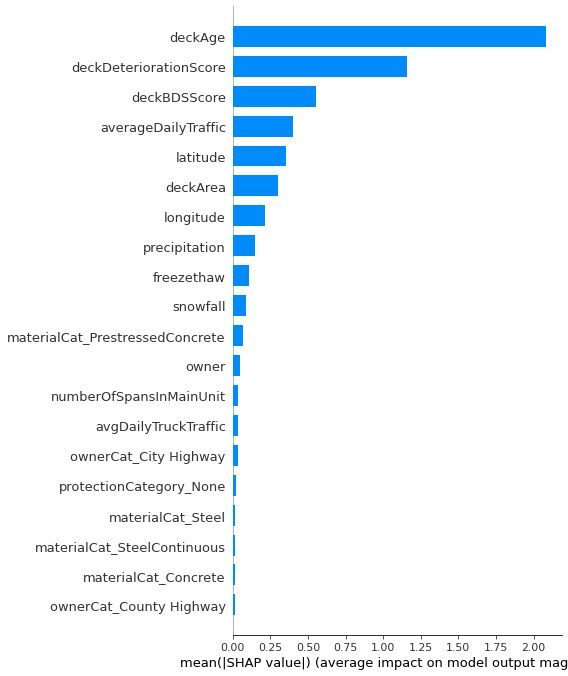

Printing top five columns: 

[('deckAge', 2.0827393398505194), ('deckDeteriorationScore', 1.1613012415590023), ('deckBDSScore', 0.5526495837101703), ('averageDailyTraffic', 0.40213693978688714), ('latitude', 0.35693966367088303)]


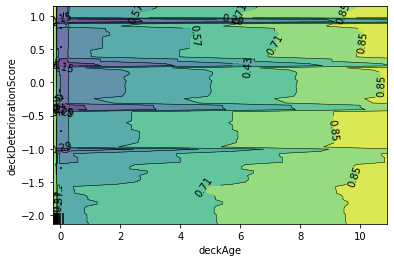

In [82]:
#import xgb_boost
concrete = remove_outliers_deterioration(concrete)
gravel = remove_outliers_deterioration(gravel)
wood = remove_outliers_deterioration(wood)
bit = remove_outliers_deterioration(bit)
other = remove_outliers_deterioration(other)
low = remove_outliers_deterioration(low)

print("Logistic Regression")
shap_int_concrete_lr, water_fall_data_int_concretelr, summary_plot_data_int_concrete_lr, concrete_classification_results_lr = logistic_regression.model(concrete)

print("Decision Tree")
shap_int_concrete_dt, water_fall_data_int_concrete_dt, summary_plot_data_int_concrete_dt, concrete_classification_results_dt = decision_tree.model(concrete)

print("XG Boost")
#shap_int_concrete_xgb, water_fall_data_int_concrete_xgb, summary_plot_data_int_concrete_xgb, concrete_classification_results_xgb = xgb_boost.model(concrete)

print("Light Boost")
shap_int_concrete_lgb, water_fall_data_int_concrete_lg, summary_plot_data_int_concrete_lg, concrete_classification_results_lg = lg_boost.model(concrete, 'Monolithic Concrete')



## Gravel

Logistic Regression
Accuracy: 0.7004048582995951
Precision: 0.5068493150684932
F1-score: 0.5068493150684932
AUC: 0.646512360258227
Kappa: 0.28618292587674765


Recall: 0.5068493150684932
Classification Report               precision    recall  f1-score   support

          No       0.79      0.78      0.79       174
         Yes       0.49      0.51      0.50        73

    accuracy                           0.70       247
   macro avg       0.64      0.64      0.64       247
weighted avg       0.70      0.70      0.70       247



Decision Tree
Accuracy: 0.7692307692307693
Precision: 0.5930232558139535
F1-score: 0.6415094339622641
AUC: 0.7487403558494725
Kappa: 0.47303215181345215


Classification Report               precision    recall  f1-score   support

          No       0.86      0.80      0.83       174
         Yes       0.59      0.70      0.64        73

    accuracy                           0.77       247
   macro avg       0.73      0.75      0.74       247
weighted avg       0.78      0.77      0.77       247



XG Boost
Light Boost
Printing max and min
-0.2792207792207792
-0.0151515151515151
Accuracy: 0.8218623481781376
Precision: 0.7272727272727273
F1-score: 0.6906474820143884
AUC: 0.874822862541332
Kappa: 0.5581395348837209


Recall: 0.6575342465753424
Classification Report               precision    recall  f1-score   support

           0       0.86      0.90      0.88       174
           1       0.72      0.64      0.68        73

    accuracy                           0.82       247
   macro avg       0.79      0.77      0.78       247
weighted avg       0.82      0.82      0.82       247



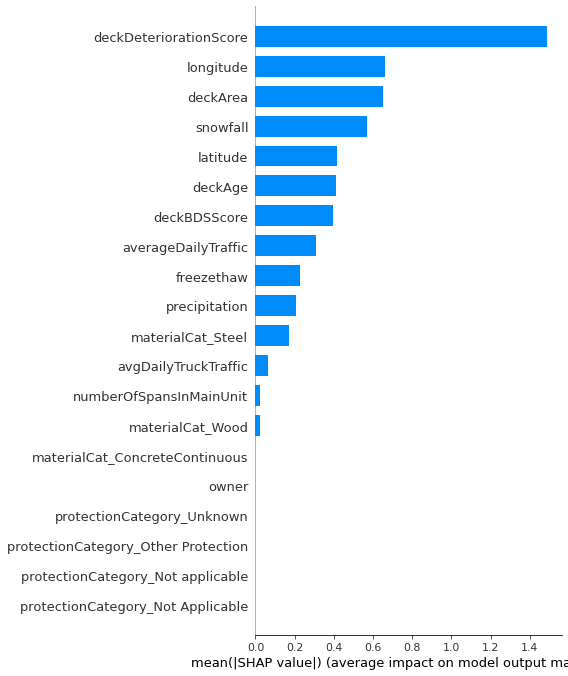

Printing top five columns: 

[('deckDeteriorationScore', 1.4881451146878912), ('longitude', 0.6611962572702261), ('deckArea', 0.6525279081785688), ('snowfall', 0.5695515291591926), ('latitude', 0.41470095329091244)]


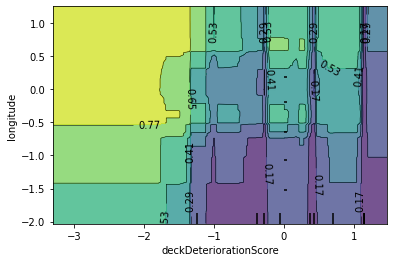

In [83]:
print("Logistic Regression")
shap_int_gravel_lr, water_fall_data_int_gravel_lr, summary_plot_data_int_gravel_lr, gravel_classification_results_lr = logistic_regression.model(gravel)

print("Decision Tree")
shap_int_gravel_dt, water_fall_data_int_gravel_dt, summary_plot_data_int_gravel_dt, gravel_classification_results_dt = decision_tree.model(gravel)

print("XG Boost")
#shap_int_gravel_xgb, water_fall_data_int_gravel_xgb, summary_plot_data_int_gravel_xgb, gravel_classification_results_xgb = xgb_boost.model(gravel)

print("Light Boost")
shap_int_gravel_lgb, water_fall_data_int_gravel_lg, summary_plot_data_int_gravel_lg, gravel_classification_results_lg = lg_boost.model(gravel, 'Gravel')



## Wood 

Logistic Regression
Accuracy: 0.6558704453441295
Precision: 0.6777251184834123
F1-score: 0.6217391304347826
AUC: 0.7103843947217441
Kappa: 0.3124621354772157


Recall: 0.5742971887550201
Classification Report               precision    recall  f1-score   support

          No       0.63      0.72      0.68       245
         Yes       0.68      0.59      0.63       249

    accuracy                           0.66       494
   macro avg       0.66      0.66      0.65       494
weighted avg       0.66      0.66      0.65       494



Decision Tree
Accuracy: 0.6538461538461539
Precision: 0.6547619047619048
F1-score: 0.6586826347305389
AUC: 0.653774280796656
Kappa: 0.3075788127674224


Classification Report               precision    recall  f1-score   support

          No       0.65      0.64      0.65       245
         Yes       0.65      0.66      0.66       249

    accuracy                           0.65       494
   macro avg       0.65      0.65      0.65       494
weighted avg       0.65      0.65      0.65       494



XG Boost
Light Boost
Printing max and min
-0.3645833333333333
-0.0149253731343283
Accuracy: 0.6923076923076923
Precision: 0.6968503937007874
F1-score: 0.7037773359840953
AUC: 0.7543480042619457
Kappa: 0.38441358277722215


Recall: 0.7108433734939759
Classification Report               precision    recall  f1-score   support

           0       0.70      0.67      0.68       245
           1       0.69      0.71      0.70       249

    accuracy                           0.69       494
   macro avg       0.69      0.69      0.69       494
weighted avg       0.69      0.69      0.69       494



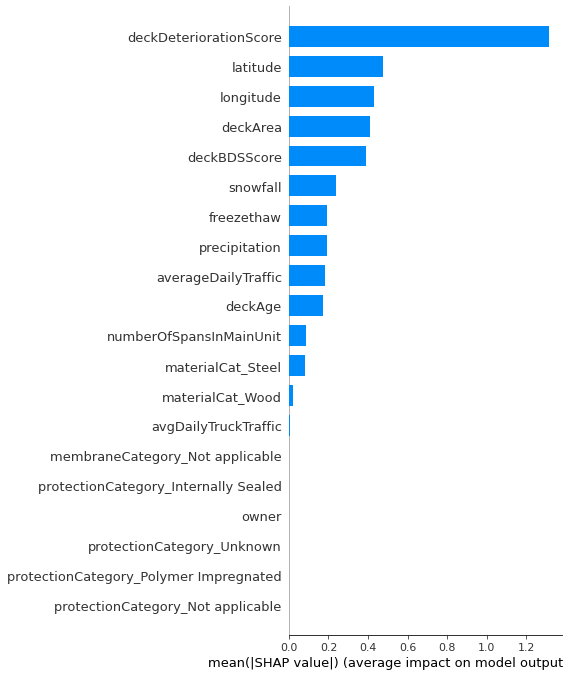

Printing top five columns: 

[('deckDeteriorationScore', 1.3132120631846709), ('latitude', 0.47398347832480187), ('longitude', 0.43218412743386114), ('deckArea', 0.4091456717616915), ('deckBDSScore', 0.38947075633086015)]


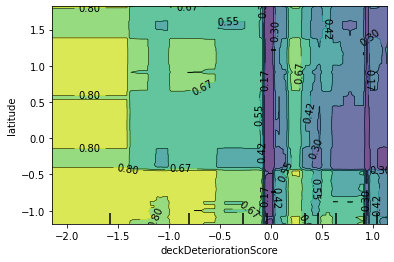

In [84]:
print("Logistic Regression")
shap_int_wood_lr, water_fall_data_int_wood_lr, summary_plot_data_int_wood_lr, wood_classification_results_lr = logistic_regression.model(wood)

print("Decision Tree")
shap_int_wood_dt, water_fall_data_int_wood_dt, summary_plot_data_int_wood_dt, wood_classification_results_dt = decision_tree.model(wood)

print("XG Boost")
#shap_int_wood_xgb, water_fall_data_int_wood_xgb, summary_plot_data_int_wood_xgb, wood_classification_results_xgb = xgb_boost.model(wood)

print("Light Boost")
shap_int_wood_lgb, water_fall_data_int_wood_lg, summary_plot_data_int_wood_lg, wood_classification_results_lg = lg_boost.model(wood, 'Wood or Timber')

## Bit

Logistic Regression
Accuracy: 0.7253886010362695
Precision: 0.64
F1-score: 0.5423728813559322
AUC: 0.7301176470588235
Kappa: 0.3619237726904123


Recall: 0.47058823529411764
Classification Report               precision    recall  f1-score   support

          No       0.75      0.86      0.80       125
         Yes       0.65      0.49      0.55        68

    accuracy                           0.73       193
   macro avg       0.70      0.67      0.68       193
weighted avg       0.72      0.73      0.71       193



Decision Tree
Accuracy: 0.7409326424870466
Precision: 0.6323529411764706
F1-score: 0.6323529411764706
AUC: 0.7161764705882353
Kappa: 0.4323529411764706


Classification Report               precision    recall  f1-score   support

          No       0.80      0.80      0.80       125
         Yes       0.63      0.63      0.63        68

    accuracy                           0.74       193
   macro avg       0.72      0.72      0.72       193
weighted avg       0.74      0.74      0.74       193



XG Boost
Light Boost
Printing max and min
-0.2222222222222222
-0.0010188487009679
Accuracy: 0.7564766839378239
Precision: 0.6842105263157895
F1-score: 0.6239999999999999
AUC: 0.8110588235294117
Kappa: 0.44597813473401327


Recall: 0.5735294117647058
Classification Report               precision    recall  f1-score   support

           0       0.79      0.86      0.82       125
           1       0.68      0.57      0.62        68

    accuracy                           0.76       193
   macro avg       0.74      0.71      0.72       193
weighted avg       0.75      0.76      0.75       193



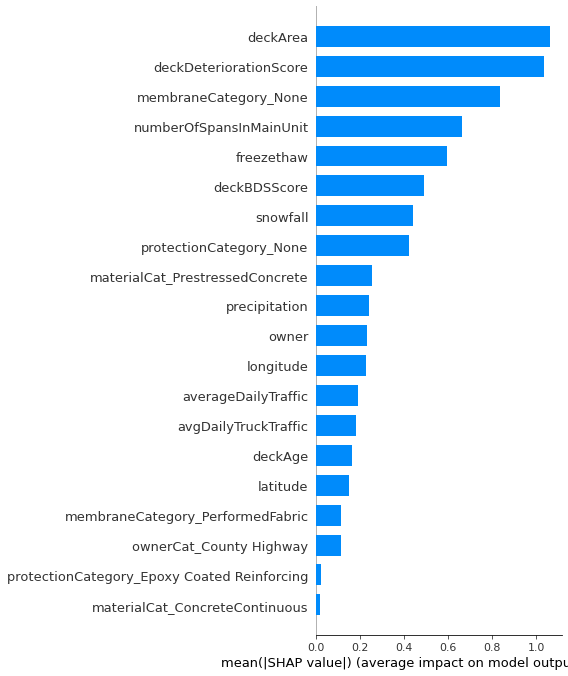

Printing top five columns: 

[('deckArea', 1.0621900303331702), ('deckDeteriorationScore', 1.0336029381119918), ('membraneCategory_None', 0.8345472574698943), ('numberOfSpansInMainUnit', 0.664370511967277), ('freezethaw', 0.5974676405201869)]


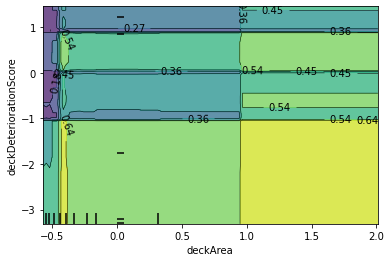

In [85]:
print("Logistic Regression")
shap_int_bit_lr, water_fall_data_int_bit_lr, summary_plot_data_int_bit_lr, bit_classification_results_lr = logistic_regression.model(bit)

print("Decision Tree")
shap_int_bit_dt, water_fall_data_int_bit_dt, summary_plot_data_int_bit_dt, bit_classification_results_dt = decision_tree.model(bit)

print("XG Boost")
#shap_int_bit_xgb, water_fall_data_int_bit_xgb, summary_plot_data_int_bit_xgb, bit_classification_results_xgb = xgb_boost.model(bit)

print("Light Boost")
shap_int_bit_lgb, water_fall_data_int_bit_lg, summary_plot_data_int_bit_lg, bit_classification_results_lg = lg_boost.model(bit, 'Bituminous')


In [86]:
bit_n = bit[bit['maintenance_needed'] == 'No']
bit_y = bit[bit['maintenance_needed'] == 'Yes']

print("Counter of bituminous no membrance protection and were maintained", Counter(bit_y['membraneCategory_None']))
print("Counter of bituminous with membrane protection and were not maintained", Counter(bit_n['membraneCategory_None']))
#print(len(bit_y))
#print(len(bit_n))
#bit['membraneCategory_Other']


Counter of bituminous no membrance protection and were maintained Counter({0: 88, 1: 34})
Counter of bituminous with membrane protection and were not maintained Counter({1: 192, 0: 72})


Logistic Regression
Accuracy: 0.8369565217391305
Precision: 0.7857142857142857
F1-score: 0.8148148148148148
AUC: 0.845670053217223
Kappa: 0.6695402298850575


Recall: 0.8461538461538461
Classification Report               precision    recall  f1-score   support

          No       0.88      0.83      0.85        53
         Yes       0.79      0.85      0.81        39

    accuracy                           0.84        92
   macro avg       0.83      0.84      0.83        92
weighted avg       0.84      0.84      0.84        92



Decision Tree
Accuracy: 0.8804347826086957
Precision: 0.868421052631579
F1-score: 0.8571428571428572
AUC: 0.8759071117561684
Kappa: 0.7543689320388349


Classification Report               precision    recall  f1-score   support

          No       0.89      0.91      0.90        53
         Yes       0.87      0.85      0.86        39

    accuracy                           0.88        92
   macro avg       0.88      0.88      0.88        92
weighted avg       0.88      0.88      0.88        92



XG Boost
Light Boost
Printing max and min
-0.213235294117647
-0.0208333333333333
Accuracy: 0.8478260869565217
Precision: 0.825
F1-score: 0.8354430379746836
AUC: 0.9201741654571843
Kappa: 0.6884373488147073


Recall: 0.8461538461538461
Classification Report               precision    recall  f1-score   support

           0       0.87      0.87      0.87        53
           1       0.82      0.82      0.82        39

    accuracy                           0.85        92
   macro avg       0.84      0.84      0.84        92
weighted avg       0.85      0.85      0.85        92



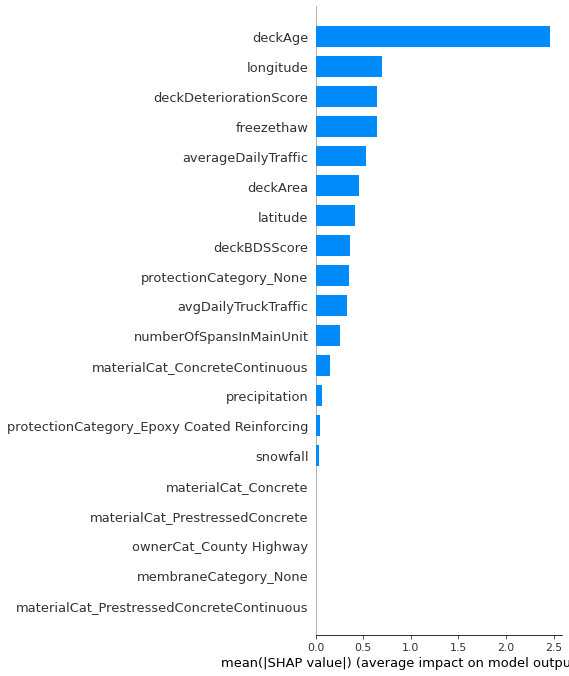

Printing top five columns: 

[('deckAge', 2.4592365349591536), ('longitude', 0.6966139983946776), ('deckDeteriorationScore', 0.6430796593842206), ('freezethaw', 0.6422798426322709), ('averageDailyTraffic', 0.524109610164413)]


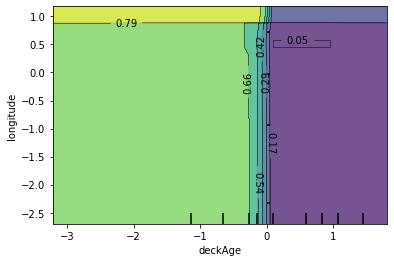

In [87]:
print("Logistic Regression")
shap_int_low_lr, water_fall_data_int_low_lr, summary_plot_data_int_low_lr, low_classification_results_lr = logistic_regression.model(low)

print("Decision Tree")
shap_int_low_dt, water_fall_data_int_low_dt, summary_plot_data_int_low_dt, low_classification_results_dt = decision_tree.model(low)

print("XG Boost")
#shap_int_low_xgb, water_fall_data_int_low_xgb, summary_plot_data_int_low_xgb, low_classification_results_xgb = xgb_boost.model(low)

print("Light Boost")
shap_int_low_lgb, water_fall_data_int_low_lg, summary_plot_data_int_low_lg, low_classification_results_lg = lg_boost.model(low, 'Low Slump Concrete')


Logistic Regression
Accuracy: 0.6533333333333333
Precision: 0.32142857142857145
F1-score: 0.40909090909090917
AUC: 0.6483050847457626
Kappa: 0.1888519134775375


Recall: 0.5625
Classification Report               precision    recall  f1-score   support

          No       0.85      0.68      0.75        59
         Yes       0.32      0.56      0.41        16

    accuracy                           0.65        75
   macro avg       0.59      0.62      0.58        75
weighted avg       0.74      0.65      0.68        75



Decision Tree
Accuracy: 0.68
Precision: 0.36666666666666664
F1-score: 0.47826086956521735
AUC: 0.6827330508474576
Kappa: 0.2771084337349399


Classification Report               precision    recall  f1-score   support

          No       0.89      0.68      0.77        59
         Yes       0.37      0.69      0.48        16

    accuracy                           0.68        75
   macro avg       0.63      0.68      0.62        75
weighted avg       0.78      0.68      0.71        75



XG Boost
Light Boost
Printing max and min
-0.2592592592592592
-0.0208333333333333
Accuracy: 0.7333333333333333
Precision: 0.4444444444444444
F1-score: 0.5581395348837209
AUC: 0.7796610169491526
Kappa: 0.37603993344425957


Recall: 0.75
Classification Report               precision    recall  f1-score   support

           0       0.91      0.73      0.81        59
           1       0.43      0.75      0.55        16

    accuracy                           0.73        75
   macro avg       0.67      0.74      0.68        75
weighted avg       0.81      0.73      0.75        75



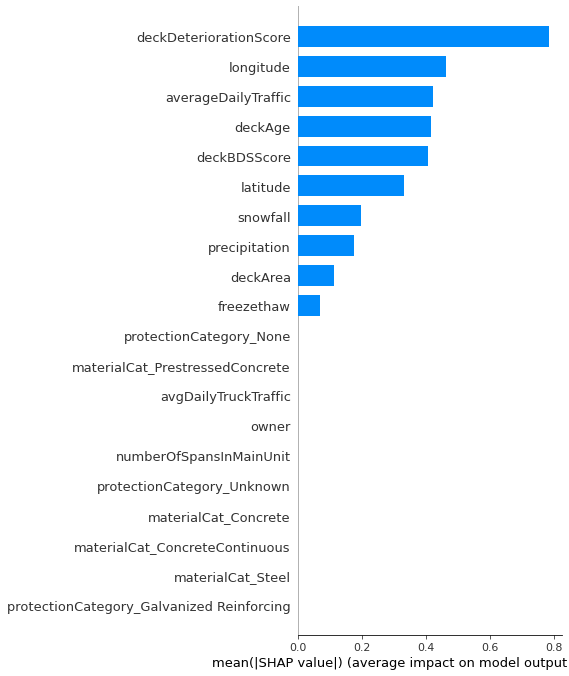

Printing top five columns: 

[('deckDeteriorationScore', 0.785544218599134), ('longitude', 0.464468485660851), ('averageDailyTraffic', 0.42281081807712717), ('deckAge', 0.41796540091137097), ('deckBDSScore', 0.40796837491873217)]


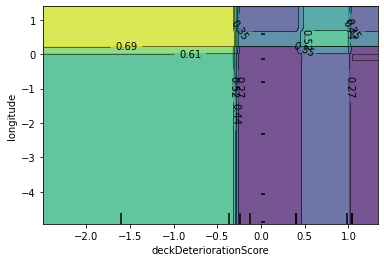

In [88]:
print("Logistic Regression")
shap_int_other_lr, water_fall_data_int_other_lr, summary_plot_data_int_other_lr, other_classification_results_lr = logistic_regression.model(other)

print("Decision Tree")
shap_int_other_dt, water_fall_data_int_other_dt, summary_plot_data_int_other_dt, other_classification_results_dt = decision_tree.model(other)

print("XG Boost")
#shap_int_other_xgb, water_fall_data_int_other_xgb, summary_plot_data_int_other_xgb, other_classification_results_xgb = xgb_boost.model(other)

print("Light Boost")
shap_int_other_lgb, water_fall_data_int_other_lg, summary_plot_data_int_other_lg, other_classification_results_lg = lg_boost.model(other, 'Other')


## Stacked barchart

In [89]:
def prepare_dataframe_plot(shap_int_concrete_lg,
                           shap_int_gravel_lg,
                           shap_int_wood_lg,
                           shap_int_bit_lg,
                           shap_int_low_lg,
                           shap_int_other_lg):
    
    # Create Maintenance, Performance, and Deterioration
    concrete_s = pd.Series(shap_int_concrete_lg, name='Monolithic Concrete')
    gravel_s = pd.Series(shap_int_gravel_lg, name='Gravel')
    wood_s = pd.Series(shap_int_wood_lg, name='Wood or Timber')
    bit_s = pd.Series(shap_int_bit_lg, name='Bituminous')
    low_s = pd.Series(shap_int_low_lg, name='Low Slump Concrete')
    other_s = pd.Series(shap_int_other_lg, name='Other')


    # Create a dataset
    df_s = pd.concat([concrete_s, gravel_s, wood_s, bit_s, low_s, other_s], axis=1)
    df_s.dropna(inplace=True)
    #df_s = df.div(df.max(0), axis='columns')


    # Attribute names
    attr_names = {
        'averageDailyTraffic': 'Avg. Daily Traffic',
        'avgDailyTruckTraffic': 'Avg. Daily Truck Traffic',
        'numberOfSpansInMainUnit': 'No. Of Spans',
        'owner':'Owner',
        'deckAge':'Deck Age',
        'longitude':'Longitude',
        'latitude':'Latitude',
        'snowfall':'Snowfall',
        'freezethaw':'Freeze-thaw',
        'precipitation':'Precipitation',
        'deckArea':'Deck Area',
        'deckArea normalized':'Deck Area',
        'structureLength normalized': 'Structure Length',
        'materialCat_Concrete':'Material Concrete',
        'materialCat_ConcreteContinuous':'Material Concrete Cont.',
        'materialCat_PrestressedConcrete':'Material Prestressed Concrete',
        'materialCat_PrestressedConcreteContinuous':'Material Prestressed Concrete Cont.',
        'materialCat_Steel':'Material Steel',
        'materialCat_SteelContinuous':'Material Steel Cont.',
        'materialCat_Wood':'Material Wood',
        'ownerCat_Bureau of Indian Affiars':'Owner Bureau of Indian Affair',
        'ownerCat_Bureau of Land Management':'Owner Bureau of Land Management',
        'ownerCat_City Highway':'Owner Bereau of City Highway',
        'ownerCat_Corps of Engineers':'Owner Corps of Engineers',
        'ownerCat_County Highway':'Owner County Highway',
        'ownerCat_Other Local':'Owner Other Local',
        'ownerCat_Other State':'Owner Other State',
        'ownerCat_Railroad':'Owner Other RailRoad',
        'ownerCat_State Highway':'Owner Other State Highway',
        'ownerCat_Town Highway':'Owner Other Towen Highway',
        'deckBDSScore':'Performance',
        'deckDeteriorationScore':'Deterioration',
        'deckDeteriorationScore normalized':'Deterioration',
        'membraneCategory_Built-up': 'Membrane - Built up',
        'membraneCategory_Epoxy': 'Membrane - Epoxy',
        'membraneCategory_None': 'Membrane - None',
        'membraneCategory_Not applicable': 'Membrane - Not Applicable',
        'membraneCategory_Other': 'Membrane - Other',
        'membraneCategory_PerformedFabric': 'Membrane - Performed Fabric',
        'membraneCategory_Unknown': 'Membrane - Unknown',
        'protectionCategory_Cathodic Protection': 'Protection - Cathodic',
        'protectionCategory_Epoxy Coated Reinforcing': 'Protection - Epoxy Coated Reinforcing',
        'protectionCategory_Galvanized Reinforcing': 'Protection - Galvanized Reinforcing',
        'protectionCategory_Internally Sealed': 'Protection - Internally Sealed',
        'protectionCategory_None': 'Protection - None',
        'protectionCategory_Not Applicable': 'Protection - Not Applicable',
        'protectionCategory_Not applicable': 'Protection - Not Applicable',
        'protectionCategory_Other Protection': 'Protection - Other',
        'protectionCategory_Polymer Impregnated': 'Protection - Polymer Impregnated',
        'protectionCategory_Unknown': 'Protection - Unknown',
    }
    
    df_s.index = df_s.index.map(attr_names)
    df_s['sum'] = df_s.sum(axis=1)
    df_s_sorted = df_s.sort_values('sum', ascending=False)
    df_s_sorted = df_s_sorted
    df_s_sorted = df_s_sorted.drop('sum', axis=1)
    
    #df_s_sorted = df_s_sorted[~(df_s_sorted[['Maintenance', 'Performance', 'Deterioration']] == 0).all(axis=1)]
    #df_s_sorted['Attr Name'] = attr_names
    #df_s_sorted = df_s_sorted.set_index('Attr Name')
    return df_s_sorted

In [90]:
df_s_sorted =  prepare_dataframe_plot(shap_int_concrete_lgb,
                           shap_int_gravel_lgb,
                           shap_int_wood_lgb,
                           shap_int_bit_lgb,
                           shap_int_low_lgb,
                           shap_int_other_lgb)

In [91]:
def plot_stacked_barchart(df_s_sorted):
    colors = px.colors.qualitative.T10

    df_plot = df_s_sorted
    # plotly
    fig = px.bar(df_plot, 
                 x = df_plot.index,
                 y = [c for c in df_plot.columns],
                 #template = 'plotly_dark',
                 color_discrete_sequence = colors,
                 #title = 'Features', 
                 )

    fig.update_layout(
        width=1200,
        height=800,
                 xaxis_title='Variable',
                 yaxis_title='SHAP value',
                 font=dict(size=16),
                 xaxis=dict(
                      tickfont=dict(size=12),
                      linecolor='black',
                 ),
                 yaxis=dict(
                      tickfont=dict(size=12),
                      tickmode='array',
                      #range=[1, 6],
                      linecolor='black'
                 ),

                 plot_bgcolor='white',

        legend=dict(orientation='h',
                    title=dict(text=''),
                    x=0.1,
                    y=1.2,
                   ),
    )

    fig.show()


In [92]:
df_s_sorted

,Monolithic Concrete,Gravel,Wood or Timber,Bituminous,Low Slump Concrete,Other
Deterioration,1.161301,1.488145,1.313212,1.033603,0.643080,0.785544
Deck Age,2.082739,0.410289,0.172866,0.163097,2.459237,0.417965
Deck Area,0.300568,0.652528,0.409146,1.062190,0.455385,0.111689
Longitude,0.212860,0.661196,0.432184,0.230286,0.696614,0.464468
Performance,0.552650,0.396430,0.389471,0.492655,0.359594,0.407968
Latitude,0.356940,0.414701,0.473983,0.149911,0.410847,0.332167
Avg. Daily Traffic,0.402137,0.309561,0.183893,0.191449,0.524110,0.422811
Freeze-thaw,0.108220,0.227266,0.191081,0.597468,0.642280,0.070815
Snowfall,0.090515,0.569552,0.239314,0.443154,0.035839,0.197493
No. Of Spans,0.037262,0.024194,0.086918,0.664371,0.258153,0.000000


In [93]:
plot_stacked_barchart(df_s_sorted)

# SHAP Feature Importance

In [94]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from pdpbox import pdp, info_plots
import matplotlib.pyplot as plt

# Load the sample data (example: Boston housing dataset)
data = get_dataset('boston')
X = data['data']
y = data['target']
feature_names = data['feature_names']

# Train a RandomForestRegressor model
model = RandomForestRegressor()
model.fit(X, y)

# Select two features to visualize the interaction
features_to_plot = ['RM', 'LSTAT']

# Calculate the interaction values
interaction_values = pdp.pdp_interact(model=model, dataset=pd.DataFrame(X, columns=feature_names), model_features=feature_names, features=features_to_plot)

# Create the interaction plot
fig, axes = pdp.pdp_interact_plot(pdp_interact_out=interaction_values, feature_names=features_to_plot, plot_type='contour')

# Display the plot
plt.show()


NameError: name 'get_dataset' is not defined

# EXTRA =====================================================

## Deterioration

In [ ]:

## Deterioration Model



def perform_logistic_regression_det(df):
    df.dropna(inplace=True)
    df.drop(df[df['deck'] == 'N'].index, inplace=True)

    attributes = remove_attributes(df)
    X = df[attributes]
    y = df['deterioration']

    # Preprocessing for numerical data
    numerical_transformer = StandardScaler()

    # Preprocessing for categorical data
    categorical_transformer = OneHotEncoder(handle_unknown='ignore')

    # Bundle preprocessing for numerical and categorical data
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numerical_transformer, attributes),])


    # Define the model
    #model = LogisticRegression()
    model = DecisionTreeClassifier(random_state=42)

    # Bundle preprocessing and modeling code in a pipeline
    my_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                  ('model', model)
                                 ])

    # Split the data
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=0)
    
    # Initialize SMOTE and resample the minority class
    smote = SMOTE(random_state=42)
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)
    
    # Define the number of fold for cross-validation
    k = 5
    kfold = KFold(n_splits=k)
    accuracy_scores = cross_val_score(my_pipeline,
                                      X_train_resampled,
                                      y_train_resampled,
                                      cv=kfold, scoring='accuracy')
    best_model_idx = accuracy_scores.argmax()
    best_model = my_pipeline
    
        
    # Preprocessing of training data, fit model 
    my_pipeline.fit(X_train_resampled, y_train_resampled)

    # Preprocessing of validation data, get predictions
    preds = my_pipeline.predict(X_valid)
    prediction_prob = my_pipeline.predict_proba(X_valid)[::,1]
    
    _cr = classification_report(y_valid, preds)
    _cm = confusion_matrix(y_valid, preds)
    
    class_label = {
        'Low':0,
        'High':1
    }
    
    testy_num = [class_label[i] for i in y_valid]
    fpr, tpr, thresholds = roc_curve(testy_num, prediction_prob)
    
    threshold = 0.5
    idx = (np.abs(thresholds - threshold)).argmin()
    y_pred_i = np.where(prediction_prob >= thresholds[idx], 1, 0)
    precision = precision_score(testy_num, y_pred_i)
    recall = recall_score(testy_num, y_pred_i)
    f1 = f1_score(testy_num, y_pred_i)
    accuracy = accuracy_score(testy_num, prediction_prob)
    auc_score = roc_auc_score(testy_num, prediction_prob)
    
    _auc = auc(fpr, tpr)
    _kappa = cohen_kappa_score(preds, y_valid,
                              weights='quadratic')
    print('AUC:',_auc)
    print('Kappa:',_kappa)
 
    
    # Print the metrics
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1-score:", f1)
    print("Accuracy:", accuracy)
    print("AUC score:", auc_score)
    
    # Initialize JavaScript for SHAP plots
    shap.initjs()

    # Explain the model's predictions using SHAP
    #X_train['deck'] = X_train['deck'].astype(int)
    
    X_train_preprocessed = preprocessor.transform(X_train)
    X_train_preprocessed = pd.DataFrame(X_train_preprocessed, columns=X_train.columns)

    X_valid_preprocessed = preprocessor.transform(X_train)
    X_valid_preprocessed = pd.DataFrame(X_valid_preprocessed, columns=X_valid.columns)
    
    #print(X_train_preprocessed.shape)
    explainer = shap.Explainer(my_pipeline.named_steps['model'], X_train_preprocessed)
    shap_values = explainer(X_valid_preprocessed, check_additivity=False)
    mean_shap = np.mean(abs(shap_values.values), 0).mean(1)
    
    # Calculating mean shap values also known as SHAP feature importance
    cols = list(X_valid_preprocessed.columns)
    mean_shap_features = {column:shap_v for column, shap_v in zip(cols, mean_shap)}

    # Visualize the first prediction's explanation
    water_fall_data = shap_values[0]
    summary_plot_data = (shap_values, X_valid_preprocessed)
    
    # For a summary plot
    #shap.summary_plot(shap_values, X_valid_preprocessed, plot_type="bar")
    return mean_shap_features, water_fall_data, summary_plot_data, classification_report(y_valid, preds)

## Concrete

In [ ]:
import logistic_regression
concrete = categorize_deterioration(concrete)
concrete_det = concrete[concrete['deterioration'].isin(['Low', 'High'])]
#shap_det_concrete, water_fall_data_det_concrete, summary_plot_data_det_concrete, classification_concrete_det = logistic_regression.deterioration(concrete_det, 'deterioration')
shap_det_concrete, water_fall_data_det_concrete, summary_plot_data_det_concrete, classification_concrete_det = perform_logistic_regression_det(concrete_det)
print(classification_concrete_det)

## Gravel

In [ ]:
gravel = categorize_deterioration(gravel)
gravel_det = gravel[gravel['deterioration'].isin(['Low', 'High'])]
shap_det_gravel, water_fall_data_det_gravel, summary_plot_data_det_gravel, classification_gravel_det = perform_logistic_regression_det(gravel_det)
print(classification_gravel_det)

In [ ]:
gravel

## Wood

In [ ]:
wood = categorize_deterioration(wood)
wood_det = wood[wood['deterioration'].isin(['Low', 'High'])]
shap_det_wood, water_fall_data_det_wood, summary_plot_data_det_wood, classification_wood_det = perform_logistic_regression_det(wood_det)
print(classification_wood_det)

## Bit 

In [ ]:
bit = categorize_deterioration(bit)
bit_det = bit[bit['deterioration'].isin(['Low', 'High'])]
shap_det_bit, water_fall_data_det_bit, summary_plot_data_det_bit, classification_bit_det = perform_logistic_regression_det(bit_det)
print(classification_bit_det)

## Low

In [ ]:
low = categorize_deterioration(low)
low_det = low[low['deterioration'].isin(['Low', 'High'])]
shap_det_low, water_fall_data_det_low, summary_plot_data_det_low, classification_low_det = perform_logistic_regression_det(low_det)
print(classification_low_det)

## Other 

In [ ]:
other = categorize_deterioration(other)
other_det = other[other['deterioration'].isin(['Low', 'High'])]
shap_det_other, water_fall_data_det_other, summary_plot_data_det_other, classification_other_det = perform_logistic_regression_det(other_det)
print(classification_other_det)

In [ ]:
Counter(list(other_det['deterioration']))

# Performance Model

In [ ]:
def perform_logistic_regression_bds(df):
    
    #df = concrete
    df.dropna(inplace=True)
    df.drop(df[df['deck'] == 'N'].index, inplace=True)


    label_map = {'Low':0,
             'High':1}
    
    # Remove 'N' from dec
    attributes = remove_attributes(df)
    #attributes.append('deckBDSScore')
    #attributes.append('deckDeteriorationScore')
    
    X = df[attributes]    
    y = df['performance']
    #y = y.map(label_map)


    # Preprocessing for numerical data
    numerical_transformer = StandardScaler()

    # Preprocessing for categorical data
    categorical_transformer = OneHotEncoder(handle_unknown='ignore')

    # Bundle preprocessing for numerical and categorical data
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numerical_transformer, attributes),])


    # Define the model
    #model = LogisticRegression()
    #model = xgb.XGBClassifier()
    model = DecisionTreeClassifier()

    # Bundle preprocessing and modeling code in a pipeline
    my_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                  ('model', model)
                                 ])
    
    
    # Split the data
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=0)
    
    # Initialize SMOTE and resample the minority class
    smote = SMOTE(random_state=42)
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)
    
    # Define the number of fold for cross-validation
    k = 5
    kfold = KFold(n_splits=k)
    accuracy_scores = cross_val_score(my_pipeline, X_train_resampled, y_train_resampled, scoring='accuracy')
    best_model_idx = accuracy_scores.argmax()
    best_model = my_pipeline

    # Preprocessing of training data, fit model 
    my_pipeline.fit(X_train_resampled, y_train_resampled)

    # Preprocessing of validation data, get predictions
    preds = my_pipeline.predict(X_valid)
    prediction_prob = my_pipeline.predict_proba(X_valid)[::,1]
    
    _cr = classification_report(y_valid, preds)
    _cm = confusion_matrix(y_valid, preds)
    
    class_label = {
        'Low':0,
        'High':1
    }
    
    testy_num = [class_label[i] for i in y_valid]
    fpr, tpr, threshold = roc_curve(testy_num, prediction_prob)
    _auc = auc(fpr, tpr)
    _kappa = cohen_kappa_score(preds, y_valid,
                              weights='quadratic')
    print('AUC:',_auc)
    print('Kappa:',_kappa)
    
    
    # Initialize JavaScript for SHAP plots
    shap.initjs()

    # Explain the model's predictions using SHAP
    #X_train['deck'] = X_train['deck'].astype(int)
    
    X_train_preprocessed = preprocessor.transform(X_train)
    X_train_preprocessed = pd.DataFrame(X_train_preprocessed, columns=X_train.columns)

    X_valid_preprocessed = preprocessor.transform(X_train)
    X_valid_preprocessed = pd.DataFrame(X_valid_preprocessed, columns=X_valid.columns)
    
    #print(X_train_preprocessed.shape)
    explainer = shap.Explainer(my_pipeline.named_steps['model'], X_train_preprocessed)
    shap_values = explainer(X_valid_preprocessed, check_additivity=False)
    mean_shap = np.mean(abs(shap_values.values), 0).mean(1)
    
    # Calculating mean shap values also known as SHAP feature importance
    cols = list(X_valid_preprocessed.columns)
    mean_shap_features = {column:shap_v for column, shap_v in zip(cols, mean_shap)}

    # Visualize the first prediction's explanation
    water_fall_data = shap_values[0]
    summary_plot_data = (shap_values, X_valid_preprocessed)
    
    # For a summary plot
    #shap.summary_plot(shap_values, X_valid_preprocessed, plot_type="bar")
    
    return mean_shap_features, water_fall_data, summary_plot_data, classification_report(y_valid, preds)

In [ ]:
concrete = categorize_performance(concrete)
concrete_bds = concrete[concrete['performance'].isin(['Low', 'High'])]
shap_bds_concrete, water_fall_data_bds_concrete, summary_plot_data_bds_concrete, classification_concrete_bds = perform_logistic_regression_bds(concrete_bds)
print(classification_concrete_bds)

In [ ]:
gravel = categorize_performance(gravel)
gravel_bds = gravel[gravel['performance'].isin(['Low', 'High'])]
shap_bds_gravel, water_fall_data_bds_gravel, summary_plot_data_bds_gravel, classification_gravel_bds = perform_logistic_regression_bds(gravel_bds)
print(classification_gravel_bds)

In [ ]:
wood = categorize_performance(wood)
wood_bds = wood[wood['performance'].isin(['Low', 'High'])]
shap_bds_wood, water_fall_data_bds_wood, summary_plot_data_bds_wood, classification_wood_bds = perform_logistic_regression_bds(wood_bds)
print(classification_wood_bds)

In [ ]:
low = categorize_performance(low)
low_bds = low[low['performance'].isin(['Low', 'High'])]
shap_bds_low, water_fall_data_bds_low, summary_plot_data_bds_low, classification_low_bds = perform_logistic_regression_bds(low_bds)
print(classification_low_bds)

In [ ]:
bit = categorize_performance(bit)
bit_bds = bit[bit['performance'].isin(['Low', 'High'])]
shap_bds_bit, water_fall_data_bds_bit, summary_plot_data_bds_bit, classification_bit_bds = perform_logistic_regression_bds(bit_bds)
print(classification_bit_bds)

In [ ]:
other = categorize_performance(bit)
other_bds = other[other['performance'].isin(['Low', 'High'])]
shap_bds_other, water_fall_data_bds_other, summary_plot_data_bds_other, classification_other_bds = perform_logistic_regression_bds(other_bds)
print(classification_other_bds)

## Concrete

### Maintenance

In [ ]:
# Example dataframe
data_corr = {'Deterioration': concrete['deckDeteriorationScore'],
             'Maintenance': concrete['Intervention Count'],
             'Performance': concrete['deckBDSScore']}

df_correlation= pd.DataFrame(data_corr)

# Calculate correlation matrix
corr_matrix = df_correlation.corr()

# Create the heatmap trace
heatmap = go.Heatmap(
    z=corr_matrix.values,
    x=corr_matrix.columns,
    y=corr_matrix.index,
    #colorscale='RdBu',
)

# Create the data list
data = [heatmap]

# Create the layout
layout = go.Layout(
    title='Concrete - Correlation between Performance, Deterioration, and Maintenance',
    xaxis=dict(title='Features'),
    yaxis=dict(title='Features')
)

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Show the figure
fig.show()

Comment:
 - There is minor correlation between performance and deterioration; this result is interesting because the deterioration across various surface wearning types doesn't vary.
 - Moreover, there maintenance distribution has wide range with median at 0 and max at 3

In [ ]:
def prepare_dataframe_plot(shap_int_concrete,
                           shap_bds_concrete,
                           shap_det_concrete):
    
    # Create Maintenance, Performance, and Deterioration
    int_s = pd.Series(shap_int_concrete, name='Maintenance')
    bds_s = pd.Series(shap_bds_concrete, name='Performance')
    det_s = pd.Series(shap_det_concrete, name='Deterioration')

    # Create a dataset
    df_s = pd.concat([int_s, bds_s, det_s], axis=1)
    df_s.dropna(inplace=True)
    #df_s = df.div(df.max(0), axis='columns')


    # Attribute names
    attr_names = {
        'averageDailyTraffic': 'Avg. Daily Traffic',
        'avgDailyTruckTraffic': 'Avg. Daily Truck Traffic',
        'numberOfSpansInMainUnit': 'No. Of Spans',
        'owner':'Owner',
        'deckAge':'Deck Age',
        'longitude':'Longitude',
        'latitude':'Latitude',
        'snowfall':'Snowfall',
        'freezethaw':'Freeze-thaw',
        'precipitation':'Precipitation',
        'deckArea':'Deck Area',
        'materialCat_Concrete':'Material Concrete',
        'materialCat_ConcreteContinuous':'Material Concrete Cont.',
        'materialCat_PrestressedConcrete':'Material Prestressed Concrete',
        'materialCat_PrestressedConcreteContinuous':'Material Prestressed Concrete Cont.',
        'materialCat_Steel':'Material Steel',
        'materialCat_SteelContinuous':'Material Steel Cont.',
        'materialCat_Wood':'Material Wood',
        'ownerCat_Bureau of Indian Affiars':'Owner Bureau of Indian Affair',
        'ownerCat_Bureau of Land Management':'Owner Bureau of Land Management',
        'ownerCat_City Highway':'Owner Bereau of City Highway',
        'ownerCat_Corps of Engineers':'Owner Corps of Engineers',
        'ownerCat_County Highway':'Owner County Highway',
        'ownerCat_Other Local':'Owner Other Local',
        'ownerCat_Other State':'Owner Other State',
        'ownerCat_Railroad':'Owner Other RailRoad',
        'ownerCat_State Highway':'Owner Other State Highway',
        'ownerCat_Town Highway':'Owner Other Towen Highway',
    }
    
    df_s.index = df_s.index.map(attr_names)
    df_s['sum'] = df_s.sum(axis=1)
    df_s_sorted = df_s.sort_values('sum', ascending=False)
    df_s_sorted = df_s_sorted
    df_s_sorted = df_s_sorted.drop('sum', axis=1)
    df_s_sorted = df_s_sorted[~(df_s_sorted[['Maintenance', 'Performance', 'Deterioration']] == 0).all(axis=1)]
    #df_s_sorted['Attr Name'] = attr_names
    #df_s_sorted = df_s_sorted.set_index('Attr Name')
    return df_s_sorted

In [ ]:
def plot_stacked_barchart(df_s_sorted):
    colors = px.colors.qualitative.T10

    df_plot = df_s_sorted
    # plotly
    fig = px.bar(df_plot, 
                 x = df_plot.index,
                 y = [c for c in df_plot.columns],
                 #template = 'plotly_dark',
                 color_discrete_sequence = colors,
                 #title = 'Features', 
                 )

    fig.update_layout(
        width=1000,
        height=800,
                 xaxis_title='Features',
                 yaxis_title='SHAP values',
                 font=dict(size=16),
                 xaxis=dict(
                      tickfont=dict(size=12),
                      linecolor='black',
                 ),
                 yaxis=dict(
                      tickfont=dict(size=12),
                      tickmode='array',
                      #range=[1, 6],
                      linecolor='black'
                 ),

                 plot_bgcolor='white',

        legend=dict(orientation='h',
                    title=dict(text=''),
                    x=0.1,
                    y=1.2,
                   ),
    )

    fig.show()
    


In [ ]:
shaps = [[shap_int_concrete, shap_bds_concrete, shap_det_concrete],
         [shap_int_gravel, shap_bds_gravel, shap_det_gravel],
         [shap_int_wood, shap_bds_wood, shap_det_wood],
         [shap_int_bit, shap_bds_bit, shap_det_bit],
         [shap_int_low, shap_bds_low, shap_det_low],
         [shap_int_other, shap_bds_other, shap_det_other]
        ]
wtypes = ['Monolithic-Concrete',
          'Gravel',
          'Wood',
          'Bituminous',
          'Low Slump Concrete',
          'Other']
 
for wtype in range(len(shaps)):
    int_shap, bds_shap, det_shap = shaps[wtype]
    df_s_sorted = prepare_dataframe_plot(int_shap,
                                         bds_shap,
                                         det_shap)
    print(wtypes[wtype])
    plot_stacked_barchart(df_s_sorted)

In [ ]:
# df_s_sorted = prepare_dataframe_plot(shap_int_other,
#                                      shap_bds_other,
#                                      shap_det_other)



In [ ]:
# #water_fall_data_det_concrete, water_fall_data_bds_concrete,  water_fall_data_int_concrete
   
# # Waterfall
# shap.plots.waterfall(water_fall_data_det_concrete)
# shap.plots.waterfall(water_fall_data_bds_concrete)
# shap.plots.waterfall(water_fall_data_int_concrete)

# # For a summary plot

# #summary_plot_data_int_low
# shap.summary_plot(summary_plot_data_det_concrete[0], summary_plot_data_det_concrete[1], plot_type="bar")
# shap.summary_plot(summary_plot_data_bds_concrete[0], summary_plot_data_bds_concrete[1], plot_type="bar")
# shap.summary_plot(summary_plot_data_int_concrete[0], summary_plot_data_int_concrete[1], plot_type="bar")

#len(summary_plot_data_int_concrete[0].values[0])
#column_headings_int_concrete = summary_plot_data_int_concrete[1].columns
#values_int_concrete = np.mean(summary_plot_data_int_concrete[0].values, axis=0)
#int_shap_concrete = dict(zip(column_headings_int_concrete, values_int_concrete))

#column_headings_bds_concrete = summary_plot_data_bds_concrete[1].columns
#values_bds_concrete = np.mean(summary_plot_data_bds_concrete[0].values, axis=0)
#bds_shap_concrete = dict(zip(column_headings_bds_concrete, values_bds_concrete))

#column_headings_det_concrete = summary_plot_data_det_concrete[1].columns
#values_det_concrete = np.mean(summary_plot_data_det_concrete[0].values, axis=0)
#det_shap_concrete = dict(zip(column_headings_det_concrete, values_det_concrete))

order_bds = sorted(shap_bds_concrete.items() , key=lambda t : t[1] , reverse=True)
order_int = sorted(shap_int_concrete.items() , key=lambda t : t[1] , reverse=True)
order_det = sorted(shap_det_concrete.items() , key=lambda t : t[1] , reverse=True)

rank_bds = [element[0] for element in order_bds]
rank_int = [element[0] for element in order_int]
rank_det = [element[0] for element in order_det]
#print(summary_plot_data_int_concrete[1].columns)
#print(summary_plot_data_det_concrete[1].columns)
#print(summary_plot_data_bds_concrete[1].columns)

In [ ]:
def order_measurement_ranks(shap_b, shap_i, shap_d):
    order_bds = sorted(shap_b.items() , key=lambda t : t[1] , reverse=True)
    order_int = sorted(shap_i.items() , key=lambda t : t[1] , reverse=True)
    order_det = sorted(shap_d.items() , key=lambda t : t[1] , reverse=True)

    rank_bds = [element[0] for element in order_bds]
    rank_int = [element[0] for element in order_int]
    rank_det = [element[0] for element in order_det]
    
    return rank_bds, rank_int, rank_det


In [ ]:
rank_bds_concrete, rank_int_concrete, rank_det_concrete = order_measurement_ranks(shap_bds_concrete, shap_int_concrete, shap_det_concrete)

In [ ]:
#### Understand the correlation between the three measurements of bridge maintenance.
# Rank Correlation

rank_bds_concrete, rank_int_concrete, rank_det_concrete = order_measurement_ranks(shap_bds_concrete,
                                                                                  shap_int_concrete,
                                                                                  shap_det_concrete)
correlation, p_value = spearmanr(rank_bds_concrete, rank_det_concrete)
print(p_value)
print("Spearman correlation coefficient:", correlation)

ranks = [rank_bds_concrete, rank_int_concrete, rank_det_concrete]
headings = ['Performance', 'Maintenance', 'Deterioration']

head1 = []
head2 = []
value = []

for i in range(0, len(ranks)):
    for j in range(0, len(ranks)):
        head1.append(headings[i])
        head2.append(headings[j])
        s_corr, p_value = spearmanr(ranks[i], ranks[j])
        value.append(s_corr)
        
df_p = pd.DataFrame({'COl 1':head1, 'COL 2': head2, 'VAL': value})
df_p

In [ ]:
rank_bds_gravel, rank_int_gravel, rank_det_gravel = order_measurement_ranks(shap_bds_gravel,
                                                                                  shap_int_gravel,
                                                                                  shap_det_gravel)
correlation, p_value = spearmanr(rank_bds_gravel, rank_int_gravel)
print(p_value)
print("Spearman correlation coefficient:", correlation)


In [ ]:
ranks = [rank_bds_gravel, rank_int_gravel, rank_det_gravel]
headings = ['Performance', 'Maintenance', 'Deterioration']

head1 = []
head2 = []
value = []

for i in range(0, len(ranks)):
    for j in range(0, len(ranks)):
        head1.append(headings[i])
        head2.append(headings[j])
        s_corr, p_value = spearmanr(ranks[i], ranks[j])
        value.append(s_corr)
        
df_p = pd.DataFrame({'COl 1':head1, 'COL 2': head2, 'VAL': value})
df_p

In [ ]:
rank_bds_wood, rank_int_wood, rank_det_wood = order_measurement_ranks(shap_bds_wood,
                                                                                  shap_int_wood,
                                                                                  shap_det_wood)
correlation, p_value = spearmanr(rank_bds_wood, rank_int_wood)
print(p_value)
print("Spearman correlation coefficient:", correlation)


In [ ]:
ranks = [rank_bds_wood, rank_int_wood, rank_det_wood]
headings = ['Performance', 'Maintenance', 'Deterioration']

head1 = []
head2 = []
value = []

for i in range(0, len(ranks)):
    for j in range(0, len(ranks)):
        head1.append(headings[i])
        head2.append(headings[j])
        s_corr, p_value = spearmanr(ranks[i], ranks[j])
        value.append(s_corr)
        
df_p = pd.DataFrame({'COl 1':head1, 'COL 2': head2, 'VAL': value})
df_p

In [ ]:
rank_bds_low, rank_int_low, rank_det_low = order_measurement_ranks(shap_bds_low,
                                                                   shap_int_low,
                                                                   shap_det_low)
correlation, p_value = spearmanr(rank_bds_low, rank_det_low)
print(p_value)
print("Spearman correlation coefficient:", correlation)

In [ ]:
ranks = [rank_bds_low, rank_int_low, rank_det_low]
headings = ['Performance', 'Maintenance', 'Deterioration']

head1 = []
head2 = []
value = []

for i in range(0, len(ranks)):
    for j in range(0, len(ranks)):
        head1.append(headings[i])
        head2.append(headings[j])
        s_corr, p_value = spearmanr(ranks[i], ranks[j])
        value.append(s_corr)
        
df_p = pd.DataFrame({'COl 1':head1, 'COL 2': head2, 'VAL': value})
df_p

In [ ]:
rank_bds_bit, rank_int_bit, rank_det_bit = order_measurement_ranks(shap_bds_bit,
                                                                                  shap_int_bit, 
                                                                                  shap_det_bit)
correlation, p_value = spearmanr(rank_bds_bit, rank_int_bit)
print(p_value)
print("Spearman correlation coefficient:", correlation)

In [ ]:
ranks = [rank_bds_bit, rank_int_bit, rank_det_bit]
headings = ['Performance', 'Maintenance', 'Deterioration']

head1 = []
head2 = []
value = []

for i in range(0, len(ranks)):
    for j in range(0, len(ranks)):
        head1.append(headings[i])
        head2.append(headings[j])
        s_corr, p_value = spearmanr(ranks[i], ranks[j])
        value.append(s_corr)
        
df_p = pd.DataFrame({'COl 1':head1, 'COL 2': head2, 'VAL': value})
df_p

In [ ]:
df_p

In [ ]:
rank_bds_other, rank_int_other, rank_det_other = order_measurement_ranks(shap_bds_other,
                                                                                  shap_int_other, 
                                                                                  shap_det_other)
correlation, p_value = spearmanr(rank_bds_other, rank_int_other)
print(p_value)
print("Spearman correlation coefficient:", correlation)

In [ ]:
ranks = [rank_bds_other, rank_int_other, rank_det_other]
headings = ['Performance', 'Maintenance', 'Deterioration']

head1 = []
head2 = []
value = []

for i in range(0, len(ranks)):
    for j in range(0, len(ranks)):
        head1.append(headings[i])
        head2.append(headings[j])
        s_corr, p_value = spearmanr(ranks[i], ranks[j])
        value.append(s_corr)
        
df_p = pd.DataFrame({'COl 1':head1, 'COL 2': head2, 'VAL': value})



In [ ]:
df_p

In [ ]:


# Assuming you have a DataFrame named df, and columns named 'Heading1', 'Heading2', and 'Values'
pivot_table = df_p.pivot_table(values='VAL', index='COL 1', columns=['COL 1', 'COL 2'], aggfunc='mean', fill_value=0)

print(pivot_table)

### Deterioration

In [ ]:
perform_logistic_regression_det(concrete)

### Performance

In [ ]:
perform_logistic_regression(concrete)

In [ ]:
perform_logistic_regression_det(concrete)

## ANOVA: Deterioration Scores

In [ ]:
def normalize_column(col):
    normalized_df = (col / col.min()) /  (col.max() - col.min())
    return normalized_df


n=50
concrete_det = normalize_column(concrete['deckDeteriorationScore'].sample(n=n))
gravel_det = normalize_column(gravel['deckDeteriorationScore'].sample(n=n))
wood_det = normalize_column(wood['deckDeteriorationScore'].sample(n=n))
bit_det = normalize_column(bit['deckDeteriorationScore'].sample(n=n))
other_det = normalize_column(other['deckDeteriorationScore'].sample(n=n))
low_det = normalize_column(low['deckDeteriorationScore'].sample(n=n))

# Perform one-way ANOVA
fvalue, pvalue = stats.f_oneway(concrete_det,
                                gravel_det,
                                wood_det,
                                bit_det,
                                other_det,
                                low_det)

# Print the results
print("F-value:", fvalue)
print("p-value:", round(pvalue, 3))

# Combine all groups into a single list
data_det = list(concrete_det) + \
       list(gravel_det) + \
       list(wood_det) + \
       list(bit_det) + \
       list(other_det) + \
       list(low_det)

# Create corresponding group labels
groups = ['Concrete'] * len(concrete_det) + \
         ['Gravel'] * len(gravel_det) + \
         ['Wood'] * len(wood_det) + \
         ['Bituminous'] * len(bit_det) + \
         ['Other'] * len(other_det) + \
         ['Low'] * len(low_det)
        
# Create a dataframe
df = pd.DataFrame({'Data': data_det, 'Group': groups})

# Perform one-way ANOVA
fvalue, pvalue = stats.f_oneway(concrete_det,
                                gravel_det,
                                wood_det,
                                bit_det,
                                other_det,
                                low_det)

# Perform post hoc Tukey's HSD test
posthoc = pairwise_tukeyhsd(df['Data'], df['Group'])

# Print the results
print("ANOVA - F-value:", fvalue)
print("ANOVA - p-value:", pvalue)
print("\nPost Hoc Tukey's HSD:")
print(posthoc)

## ANOVA: Baseline difference score

In [ ]:
n=300
concrete_det = normalize_column(concrete['deckBDSScore'].sample(n=n))
gravel_det = normalize_column(gravel['deckBDSScore'].sample(n=n))
wood_det = normalize_column(wood['deckBDSScore'].sample(n=n))
bit_det = normalize_column(bit['deckBDSScore'].sample(n=n))
other_det = normalize_column(other['deckBDSScore'].sample(n=n))
low_det = normalize_column(low['deckBDSScore'].sample(n=n))

# Perform one-way ANOVA
fvalue, pvalue = stats.f_oneway(concrete_det,
                                gravel_det,
                                wood_det,
                                bit_det,
                                other_det,
                                low_det)
# Print the results
print("F-value:", fvalue)
print("p-value:", round(pvalue, 3))

# Combine all groups into a single list
data_bds = list(concrete_det) + \
       list(gravel_det) + \
       list(wood_det) + \
       list(bit_det) + \
       list(other_det) + \
       list(low_det)

# Create corresponding group labels
groups = ['Concrete'] * len(concrete_det) + \
         ['Gravel'] * len(gravel_det) + \
         ['Wood'] * len(wood_det) + \
         ['Bituminous'] * len(bit_det) + \
         ['Other'] * len(other_det) + \
         ['Low'] * len(low_det)
        
# Create a dataframe
df = pd.DataFrame({'Data': data_bds, 'Group': groups})

# Perform one-way ANOVA
fvalue, pvalue = stats.f_oneway(concrete_det,
                                gravel_det,
                                wood_det,
                                bit_det,
                                other_det,
                                low_det)

# Perform post hoc Tukey's HSD test
posthoc = pairwise_tukeyhsd(df['Data'], df['Group'])

# Print the results
print("ANOVA - F-value:", fvalue)
print("ANOVA - p-value:", pvalue, 3)
print("\nPost Hoc Tukey's HSD:")
print(posthoc)

## ANOVA: Intervention Score

In [ ]:
n=300
concrete_det = concrete['Intervention Count'].sample(n=n)
gravel_det = gravel['Intervention Count'].sample(n=n)
wood_det = wood['Intervention Count'].sample(n=n)
bit_det = bit['Intervention Count'].sample(n=n)
other_det = other['Intervention Count'].sample(n=n)
low_det = low['Intervention Count'].sample(n=n)

#concrete_det = normalize_column(concrete['Intervention Count'].sample(n=n))
# gravel_det = normalize_column(gravel['Intervention Count'].sample(n=n))
# wood_det = normalize_column(wood['Intervention Count'].sample(n=n))
# bit_det = normalize_column(bit['Intervention Count'].sample(n=n))
# other_det = normalize_column(other['Intervention Count'].sample(n=n))
# low_det = normalize_column(low['Intervention Count'].sample(n=n))

# Perform one-way ANOVA
fvalue, pvalue = stats.f_oneway(concrete_det,
                                gravel_det,
                                wood_det,
                                bit_det,
                                other_det,
                                low_det)

# Print the results
print("F-value:", fvalue)
print("p-value:", round(pvalue, 3))


# Combine all groups into a single list
data_int = list(concrete_det) + \
       list(gravel_det) + \
       list(wood_det) + \
       list(bit_det) + \
       list(other_det) + \
       list(low_det)

# Create corresponding group labels
groups = ['Concrete'] * len(concrete_det) + \
         ['Gravel'] * len(gravel_det) + \
         ['Wood'] * len(wood_det) + \
         ['Bituminous'] * len(bit_det) + \
         ['Other'] * len(other_det) + \
         ['Low'] * len(low_det)
        
# Create a dataframe
df = pd.DataFrame({'Data': data_int, 'Group': groups})

# Perform one-way ANOVA
fvalue, pvalue = stats.f_oneway(concrete_det,
                                gravel_det,
                                wood_det,
                                bit_det,
                                other_det,
                                low_det)

# Perform post hoc Tukey's HSD test
posthoc = pairwise_tukeyhsd(df['Data'], df['Group'])

# Print the results
print("ANOVA - F-value:", fvalue)
print("ANOVA - p-value:", pvalue)
print("\nPost Hoc Tukey's HSD:")
print(posthoc)

In [ ]:
# Example dataframe
data_corr = {'Deterioration': data_det,
             'Maintenance': data_int,
             'Performance': data_bds}

df_correlation= pd.DataFrame(data_corr)

# # Calculate correlation matrix
corr_matrix = df_correlation.corr()

# Create the heatmap trace
heatmap = go.Heatmap(
    z=corr_matrix.values,
    x=corr_matrix.columns,
    y=corr_matrix.index,
    #colorscale='RdBu',
)

# Create the data list
data = [heatmap]

# Create the layout
layout = go.Layout(
    title='Correlation Heatmap',
    xaxis=dict(title='Features'),
    yaxis=dict(title='Features')
)

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Show the figure
fig.show()

In [ ]:
## Why are these three measures not correlated?
## Understanding these attributes from the perspective of individual attributes?

# 1. Structure Length
# 2. Number of Spans of the Bridges
# 3. Average Daily Traffic
# 4. Snowfall
# 5. Freezethaw
# 6. Region
# 7. Area
# 8. Precipitation

## Further categorization of the bridges

In [ ]:
# # Categorizing
# short = combinedDf[(combinedDf['structureLength'] >= 40) & (combinedDf['structureLength'] < 80)]
# medium = combinedDf[(combinedDf['structureLength'] >= 81) & (combinedDf['structureLength'] < 100)]
# long = combinedDf[(combinedDf['structureLength'] >= 150)]

In [ ]:
adtCategory = list()
for adt in segment_1['averageDailyTraffic']:
    if adt < 100:
        adtCategory.append("Very Light")
    elif 100 < adt <= 1000:
        adtCategory.append("Light")
    elif 1000 < adt <= 5000:
        adtCategory.append("Moderate")
    elif adt > 5000:
        adtCategory.append("High")
    else:
        adtCategory.append(None)

segment_1['ADT Category'] = adtCategory

countInterventions

## The End

In [ ]:
# Plot distrbution of baseline difference score with respect to average daily traffic
fig = px.box(segment_1, x='ADT Category', y="deckBDSScore")
fig.show()

In [ ]:
# Barchart 
very_light = segment_1[segment_1['ADT Category'] == 'Very Light']
very_light['Intervention Count'] = countInterventions(very_light)

light = segment_1[segment_1['ADT Category'] == 'Light']
light['Intervention Count'] = countInterventions(light)

moderate = segment_1[segment_1['ADT Category'] == 'Moderate']
moderate['Intervention Count'] = countInterventions(moderate)

heavy = segment_1[segment_1['ADT Category'] == 'High']
heavy['Intervention Count'] = countInterventions(heavy)

countDictDf = defaultdict(list)

# Creating a new dictionary for visualization
interventionCountNumber(very_light, countDictDf, 3)
interventionCountNumber(light, countDictDf, 3)
interventionCountNumber(moderate, countDictDf, 3)
interventionCountNumber(heavy, countDictDf, 3)

sum_0 = 0
sum_1 = 0
sum_2 = 0
sum_3 = 0
for key, value in countDictDf.items():
    sum_0 = sum_0 + value[0]
    sum_1 = sum_1 + value[1]
    sum_2 = sum_2 + value[2]
    sum_3 = sum_3 + value[3]
    
types = ['Very Light', 'Light', 'Moderate', 'High']
fig = go.Figure(data=[
     go.Bar(name='Zero Intervention',
            x=types, y=np.array(countDictDf[0])/np.array([sum_0, sum_1, sum_2, sum_3]),
            marker_color='orange'),
    
     go.Bar(name='One Intervention',
            x=types, y=np.array(countDictDf[1])/np.array([sum_0, sum_1, sum_2, sum_3]),
            marker_color='brown'),
    
     go.Bar(name='Two Interventions',
            x=types, y=countDictDf[2]/np.array([sum_0, sum_1, sum_2, sum_3]),
            marker_color='gray'),  
 ])

fig.update_layout(barmode='group',
                      title='Ratio of Intervention, Bridges with respect to ADT')
fig.show()

In [ ]:
# Select bridge with very light and heavy traffic
veryLight = segment_1[segment_1['ADT Category'] == 'Very Light']
notVeryLight = segment_1[segment_1['ADT Category'].isin(['High'])]

# Select Owners
veryLightSelectedOwners = veryLight[veryLight['owner'].isin([1, 2, 4])]

# Mapping agency names to agency code for very light state owners
veryLightSelectedOwners['owner'] = veryLightSelectedOwners['owner'].map({
                                1:'State Highway Agency',
                                2:'County Highway Agency',
                                4:'City or Muncipal Highway Agency'
                            })

notVeryLightSelectedOwners = notVeryLight[notVeryLight['owner'].isin([1, 2, 4])]

# Mapping agency names to agency code for heavy selected owners
notVeryLightSelectedOwners['owner'] = notVeryLightSelectedOwners['owner'].map({
                                1:'State Highway Agency',
                                2:'County Highway Agency',
                                4:'City or Muncipal Highway Agency'
                            })

# Boxplot
nVbdsOwner = defaultdict()
for i in notVeryLightSelectedOwners.groupby(['owner']):
    nVbdsOwner[i[0]] = i[1]['deckBDSScore']
    
vBdsOwner = defaultdict()
for i in veryLightSelectedOwners.groupby(['owner']):
    vBdsOwner[i[0]] = i[1]['deckBDSScore']


fig = go.Figure()
fig.add_trace(go.Box(y=vBdsOwner['County Highway Agency'], name='County Highway Agency'))
fig.add_trace(go.Box(y=vBdsOwner['City or Muncipal Highway Agency'], name='City or Muncipal Highway Agency'))
fig.add_trace(go.Box(y=vBdsOwner['State Highway Agency'], name='State Highway Agency'))
fig.update_layout(title_text="Bridges with Very Light ADT")
fig.show()    
    
    
fig = go.Figure()
fig.add_trace(go.Box(y=nVbdsOwner['County Highway Agency'], name='County Highway Agency'))
fig.add_trace(go.Box(y=nVbdsOwner['City or Muncipal Highway Agency'], name='City or Muncipal Highway Agency'))
fig.add_trace(go.Box(y=nVbdsOwner['State Highway Agency'], name='State Highway Agency'))
fig.update_layout(title_text="Bridges with Heavy ADT")
fig.show()

In [ ]:
# Analysis of State owned bridges with Very light (Gravel) Vs. Non-state owned bridges with high ADT (Paved).

# Mapping agency names to agency code
selectedBridges = segment_1[segment_1['owner'].isin([1, 2, 4])]
selectedBridges['Owner'] = selectedBridges['owner'].map({
                                    1:'State Highway Agency',
                                    2:'County Highway Agency',
                                    4:'City or Muncipal Highway Agency'
                            })

# StateOwned Vs. Non State Owned 
stateOwned = selectedBridges[selectedBridges['owner'].isin(['State Highway Agency'])]
nonStateOwned = selectedBridges[~selectedBridges['owner'].isin(['State Highway Agency'])]

# stateOwned - Heavy ADT bridges 
paved = stateOwned[stateOwned['ADT Category'].isin(['High'])]

# NonStateOwned - Very Light ADT bridges
gravel = nonStateOwned[nonStateOwned['ADT Category'].isin(['Very Light'])]


# Join the two dataframes, and plot with respect to category and 
paved['Category'] = 'Paved'
gravel['Category'] = 'Gravel'

# Concatenate two separate dataframes
combinedDf = pd.concat([gravel, paved])

# Print Summary:
print("No. of bridges that are State Owned Bridges with Heavy Traffic: ", len(paved))
print("Mean BDS that are State Owned Bridges with Heavy Traffic: ", np.mean(paved['deckBDSScore']))
print("\n")
print("No. of bridges that are Non State Owned Bridges with Very Light Traffic: ", len(gravel))
print("Mean BDS that are Non State Owned Bridges with Very Light Traffic: ", np.mean(gravel['deckBDSScore']))

# Plot distribution
fig = px.box(combinedDf, x='Category', y="deckBDSScore")
fig.show()

In [ ]:
x1 = combinedDf[combinedDf['Category']=='Gravel']['structureLength']
x2 = combinedDf[combinedDf['Category']=='Paved']['structureLength']

fig = go.Figure()
fig.add_trace(go.Histogram(
    x=x1,
    histnorm='percent',
    name='Gravel', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=1
     ),
    marker_color='#EB89B5',
    opacity=0.75
))

fig.add_trace(go.Histogram(
    x=x2,
    histnorm='percent',
    name='Paved', # name used in legend and hover labels
     xbins=dict( # bins used for histogram
         start=0,
         end=200,
         size=1
     ),
    marker_color='#808080',
    opacity=0.75
))


fig.update_layout(
    title_text='Distribution of bridges, by structure length', # title of plot
    xaxis_title_text='Structure Length', # xaxis label
    yaxis_title_text='Count', # yaxis label
    bargap=0.2, # gap between bars of adjacent location coordinates
    bargroupgap=0.1 # gap between bars of the same location coordinates
)

fig.show()
print("\n The average length of the bridges: ", np.mean(x1), " meters")

# show the distribution with respect to the gravel and paved

In [ ]:
# Categorizing
short = combinedDf[(combinedDf['structureLength'] >= 40) & (combinedDf['structureLength'] < 80)]
medium = combinedDf[(combinedDf['structureLength'] >= 81) & (combinedDf['structureLength'] < 100)]
long = combinedDf[(combinedDf['structureLength'] >= 150)]

In [ ]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(
        go.Box(y=segment_1_noisy['structureLength'],
              name='With outliers',
              marker_color='pink'),
              row=1, col=1,   
)

fig.add_trace(
        go.Box(y=segment_1['structureLength'],
              name='Without outliers',
              marker_color='darkblue'),
              row=1, col=2,
            
)
fig.update_layout(height=600,
                  width=800,
                  title_text="Distribution of structure length with and without outliers")
fig.show()

In [ ]:
fig = make_subplots(rows=1, cols=2)
typesOfBridge = ['Short', 'Medium', 'Long']
fig.add_trace(
        go.Bar(x=typesOfBridge, y=[len(short),
                                   len(medium),
                                   len(long)],
              name='With outliers'), 
)
fig.update_layout(height=500,
                  width=1000,
                  title_text="Number of bridges with respect to length")
fig.show()

In [ ]:
# # Counting number of bridges per owner
# catCountShort = short.groupby(['Category']).count()
# catCountMedium = medium.groupby(['Category']).count()
# catCountLong = long.groupby(['Category']).count()

# pavedCount = list()
# pavedCount.append(catCountShort['structureNumber']['Paved'])
# pavedCount.append(catCountMedium['structureNumber']['Paved'])
# pavedCount.append(catCountLong['structureNumber']['Paved'])

# gravelCount = list()
# gravelCount.append(catCountShort['structureNumber']['Gravel'])
# gravelCount.append(catCountMedium['structureNumber']['Gravel'])
# gravelCount.append(catCountLong['structureNumber']['Gravel'])

# types = ['Short', 'Medium', 'Long']

# fig = go.Figure(data=[
#     go.Bar(name='Paved',
#            x=types, y=pavedCount,
#            marker_color='goldenrod'),
#     go.Bar(name='Gravel', x=types, y=gravelCount,
#           marker_color='purple')
# ])

# # Change the bar mode
# fig.update_layout(barmode='group',
#                   title='Bridges with respect to Length and (Paved vs. Gravel)')
# fig.show()